In [1]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R
from scipy.optimize import least_squares
import time
from lightglue import LightGlue, ALIKED

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"[INFO] Using device: {device}")

[INFO] Using device: cpu


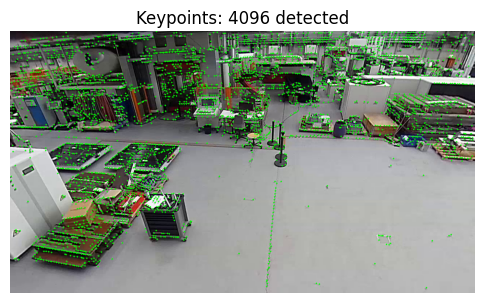

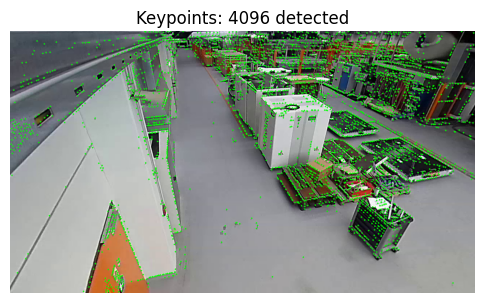

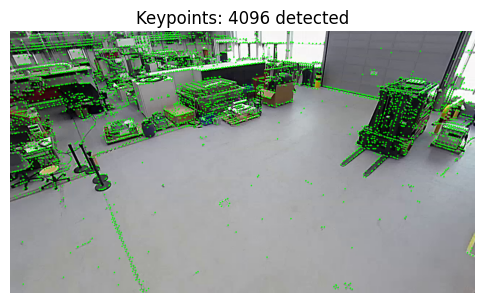

[PAIR] Crop 0 ↔ Crop 1: 1141 matches (mean conf: 0.777)


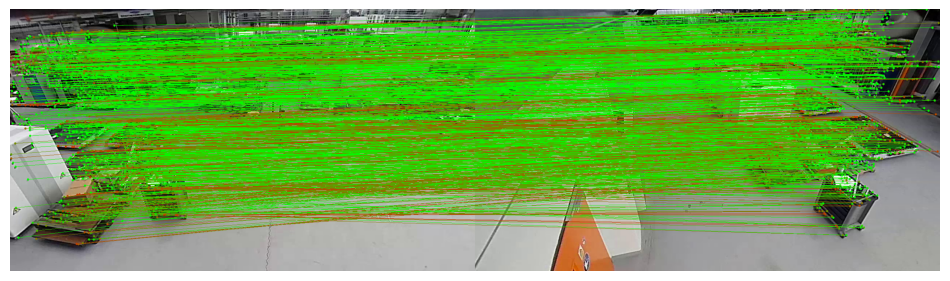

[PAIR] Crop 0 ↔ Crop 2: 1366 matches (mean conf: 0.843)


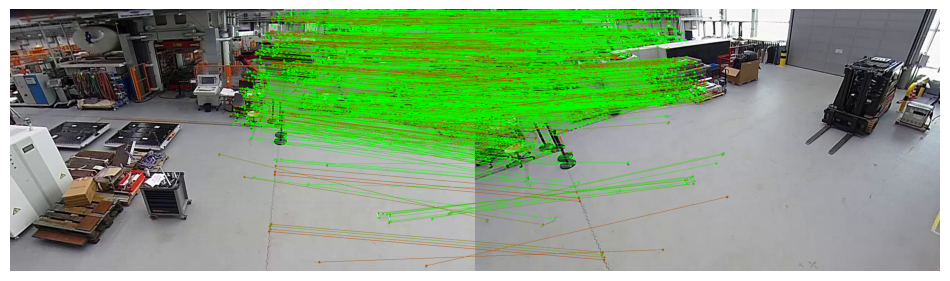

[PAIR] Crop 1 ↔ Crop 2: 3 matches (mean conf: 0.318)


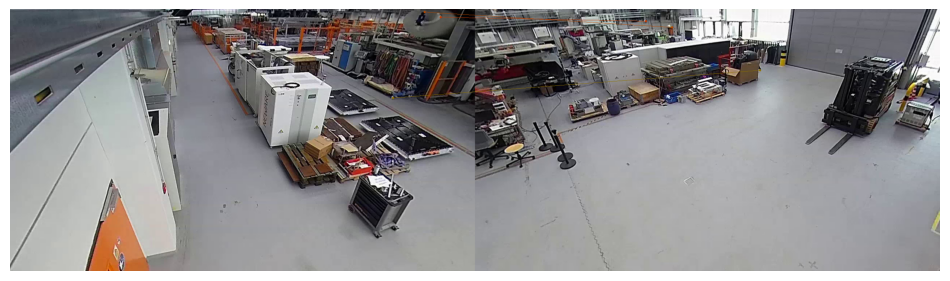

In [2]:

# ALIKED + LIGHTGLUE 

aliked = ALIKED(
    max_num_keypoints=4096,
    detection_threshold=0.002
).eval().to(device)

matcher = LightGlue(
    features='aliked',
    filter_threshold=0.07,
    width_confidence=0.99,
    depth_confidence=0.95
).eval().to(device)

crop_paths = [
    "captures_yaw_pitch/capture1/view1_1.jpg",
    "captures_yaw_pitch/capture1/view2_1.jpg",
    "captures_yaw_pitch/capture1/view4_1.jpg"
]

images,image_bgr, image_rgb = [], [], []
for path in crop_paths:
    img_bgr = cv2.imread(path)
    if img_bgr is None:
        raise FileNotFoundError(f"Image not found: {path}")
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_tensor = torch.from_numpy(img_rgb).permute(2, 0, 1).float() / 255.0
    img_tensor = img_tensor.unsqueeze(0).to(device)
    images.append(img_tensor)
    image_bgr.append(img_bgr)
    image_rgb.append(img_rgb)

# Extract ALIKED features 
features = []
for idx, (img, img_bgr) in enumerate(zip(images,image_bgr)):
    with torch.no_grad():
        feat = aliked({'image': img})
        for key in ['keypoints', 'descriptors']:
            if feat[key].ndim == 2:
                feat[key] = feat[key].unsqueeze(0)
        features.append(feat)

    n_kpts = feat['keypoints'].shape[1]
    keypoints = feat['keypoints'][0].cpu().numpy()
    img_disp = img_bgr.copy()
    for (x, y) in keypoints.astype(int):
        cv2.circle(img_disp, (x, y), 2, (0, 255, 0), -1)

    plt.figure(figsize=(6, 4))
    plt.imshow(cv2.cvtColor(img_disp, cv2.COLOR_BGR2RGB))
    plt.title(f"Keypoints: {len(keypoints)} detected")
    plt.axis('off')
    plt.show()

# Match all pairs
n_crops = len(images)
matches_dict = {}

for i in range(n_crops):
    for j in range(i + 1, n_crops):
        data = {'image0': features[i], 'image1': features[j]}
        with torch.no_grad():
            pred = matcher(data)

        matches0 = pred['matches0'][0].cpu().numpy()
        conf = pred.get('matching_scores0', None)
        conf = conf[0].cpu().numpy() if conf is not None else np.zeros_like(matches0)
        valid = (matches0 > -1) & (conf >0.2)

        mkpts0 = features[i]['keypoints'][0].cpu().numpy()[valid]
        mkpts1 = features[j]['keypoints'][0].cpu().numpy()[matches0[valid]]
        mconf = conf[valid]
        matches_dict[(i, j)] = (mkpts0, mkpts1)

        mean_conf = np.mean(mconf) if len(mconf) > 0 else 0
        print(f"[PAIR] Crop {i} ↔ Crop {j}: {len(mkpts0)} matches (mean conf: {mean_conf:.3f})")

        img0 = image_bgr[i]
        img1 = image_bgr[j]
        h1, w1 = img0.shape[:2]
        h2, w2 = img1.shape[:2]
        canvas = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
        canvas[:h1, :w1] = img0
        canvas[:h2, w1:] = img1

        for (x1, y1), (x2, y2), c in zip(mkpts0.astype(int), mkpts1.astype(int), mconf):
            color = (0, int(255 * c), int(255 * (1 - c)))  
            cv2.circle(canvas, (int(x1), int(y1)), 3, color, -1)
            cv2.circle(canvas, (int(x2) + w1, int(y2)), 3, color, -1)
            cv2.line(canvas, (int(x1), int(y1)), (int(x2) + w1, int(y2)), color, 1)

        plt.figure(figsize=(12, 6))
        plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()
        


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# =====================================================
# Parameters
# =====================================================
RECT_W, RECT_H, VIEW_FOV = 1280, 720, 90.0
Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

# =====================================================
# Helper: Rect → Fisheye warp with circular mask
# =====================================================
def project_rect_to_fisheye_clipped(rect_img, R_cam, fisheye_params, Wr=1280, Hr=720, fov_deg=90.0):
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)

    ray_global = np.dstack([
        sin_t * np.cos(phi),
        sin_t * np.sin(phi),
        np.cos(theta)
    ])

    f = (Wr / 2.0) / np.tan(np.deg2rad(fov_deg / 2.0))
    cx_r, cy_r = Wr / 2.0, Hr / 2.0

    ray_local = ray_global @ R_cam
    Xc, Yc, Zc = ray_local[..., 0], ray_local[..., 1], ray_local[..., 2]
    u = f * (Xc / (Zc + 1e-12)) + cx_r
    v = f * (Yc / (Zc + 1e-12)) + cy_r

    valid = (u >= 0) & (u < Wr) & (v >= 0) & (r <= radius) & (Zc > 0)
    warped = cv2.remap(
        (rect_img * 255).astype(np.uint8),
        u.astype(np.float32), v.astype(np.float32),
        interpolation=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT
    ).astype(np.float32) / 255.0

    # ✅ Mask outside fisheye circle
    circle_mask = (dx**2 + dy**2) <= radius**2
    warped[~circle_mask] = 0
    valid &= circle_mask
    return warped, valid

# =====================================================
# Helper: Fisheye → Rect backprojection
# =====================================================
def project_fisheye_to_rect(fish_img, R_cam, fisheye_params, Wr=1280, Hr=720, fov_deg=90.0):
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    xs, ys = np.meshgrid(np.arange(Wr), np.arange(Hr))
    f = (Wr / 2.0) / np.tan(np.deg2rad(fov_deg / 2.0))
    cx_r, cy_r = Wr / 2.0, Hr / 2.0

    x = (xs - cx_r) / f
    y = (ys - cy_r) / f
    ray_local = np.dstack((x, y, np.ones_like(x)))
    ray_local /= np.linalg.norm(ray_local, axis=-1, keepdims=True)
    ray_global = ray_local @ R_cam.T

    X, Y, Z = ray_global[..., 0], ray_global[..., 1], ray_global[..., 2]
    theta = np.arccos(np.clip(Z, -1, 1))
    phi = np.arctan2(Y, X)
    r = (theta / theta_max) * radius
    u = fisheye_params["cx"] + r * np.cos(phi)
    v = fisheye_params["cy"] - r * np.sin(phi)

    valid = (r <= radius) & (Z > 0)
    rect_back = cv2.remap(
        (fish_img * 255).astype(np.uint8),
        u.astype(np.float32), v.astype(np.float32),
        interpolation=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT
    ).astype(np.float32) / 255.0
    return rect_back, valid

# =====================================================
# Multi-view diagnostic loop
# =====================================================
for i, (rect_img, R_cam) in enumerate(zip(views, R_list_global)):
    fish_wrap, valid = project_rect_to_fisheye_clipped(rect_img, R_cam, fisheye_params)
    rect_back, valid_back = project_fisheye_to_rect(fisheye_img, R_cam, fisheye_params)

    # Difference maps
    diff_photo = np.abs(cv2.resize(fish_wrap, (fisheye_img.shape[1], fisheye_img.shape[0])) - fisheye_img)
    diff_geom = np.abs(rect_back - rect_img)

    # Compute MSEs
    mse_photo = np.mean(diff_photo**2)
    mse_geom = np.mean(diff_geom**2)

    print(f"\n[View {i}] Photometric MSE: {mse_photo:.5f}, Geometric MSE: {mse_geom:.5f}")

    # Visualization
    plt.figure(figsize=(16, 8))
    plt.subplot(2, 3, 1); plt.imshow(rect_img); plt.title(f"View {i} Rectilinear")
    plt.subplot(2, 3, 2); plt.imshow(fish_wrap); plt.title("Rect → Fisheye (Clipped)")
    plt.subplot(2, 3, 3); plt.imshow(diff_photo); plt.title("Photometric Difference")
    plt.subplot(2, 3, 4); plt.imshow(fisheye_img); plt.title("Real Fisheye")
    plt.subplot(2, 3, 5); plt.imshow(rect_back); plt.title("Fisheye → Rect")
    plt.subplot(2, 3, 6); plt.imshow(diff_geom); plt.title("Geometric Difference")
    plt.tight_layout()
    plt.show()


In [3]:
# -----------------------------
# Replace intrinsics & helpers
# -----------------------------
import numpy as np
import cv2

# --- your geometry-accurate fisheye parameters (keep these) ---
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# helper to build K_rect from view/resolution (matches project/fisheye code)
def build_K_rect_from_view(Wr=1280, Hr=720, fov_deg=90.0, cx=None, cy=None):
    """Return K_rect consistent with f = (W/2)/tan(fov/2)."""
    if cx is None: cx = Wr / 2.0
    if cy is None: cy = Hr / 2.0
    f = (Wr / 2.0) / np.tan(np.deg2rad(fov_deg / 2.0))
    K = np.array([[f, 0.0, cx],
                  [0.0, f, cy],
                  [0.0, 0.0, 1.0]], dtype=np.float64)
    return K

# helper to build K_fisheye consistent with equidistant model r = f * theta
def build_K_fisheye_from_params(fish_params):
    """f_fish = radius / theta_max"""
    f_fish = fish_params["radius"] / fish_params["theta_max_rad"]
    Kf = np.array([[f_fish, 0.0, fish_params["cx"]],
                   [0.0, f_fish, fish_params["cy"]],
                   [0.0, 0.0, 1.0]], dtype=np.float64)
    return Kf

# Build the matrices used in BA (call these once)
# Use same rect resolution as your rect images (seen in project functions)
RECT_W, RECT_H = 1280, 720   # keep consistent with the rest of your pipeline
# If your views have per-view FOVs (cam_settings), we pick the first view's fov for K_rect.
# If different views have different fov, compute per-view K_rect inside the loops (but usually same).
VIEW_FOV =  90.0

K_rect = build_K_rect_from_view(RECT_W, RECT_H, VIEW_FOV, cx=RECT_W/2, cy=RECT_H/2)
K_fisheye = build_K_fisheye_from_params(fisheye_params)
D_fisheye = np.zeros(4, dtype=np.float64)   # your idealized no-distortion vector

# -------------------------
# Geometry helper routines
# -------------------------
def normalize(v):
    n = np.linalg.norm(v, axis=-1, keepdims=True)
    n[n == 0] = 1.0
    return v / n

def rectilinear_to_ray(px, K=K_rect):
    """
    Map pixel coordinates (N x 2) in rect image to normalized 3D rays (N x 3).
    Uses K_rect (fx,fy,cx,cy) consistent with project/fisheye code.
    """
    px = np.asarray(px, np.float64).reshape(-1, 2)
    fx, fy = K[0,0], K[1,1]
    cx, cy = K[0,2], K[1,2]
    x = (px[:, 0] - cx) / fx
    y = (px[:, 1] - cy) / fy
    v = np.stack([x, y, np.ones_like(x)], axis=-1)
    return normalize(v)

def fisheye_project_ray(ray, K=K_fisheye, D=D_fisheye):
    """
    Project 3D rays (N x 3) into fisheye pixel coordinates using OpenCV fisheye model.
    ray is expected in the camera frame (i.e. unit direction vectors).
    Uses cv2.fisheye.projectPoints for realistic pixel projection.
    """
    pts = np.asarray(ray, np.float64).reshape(-1, 1, 3)
    # zero rotation/translation because ray is already in camera frame
    rvec = np.zeros((3,), dtype=np.float64)
    tvec = np.zeros((3,), dtype=np.float64)
    imgpts, _ = cv2.fisheye.projectPoints(pts, rvec, tvec, K, D)
    return imgpts.reshape(-1, 2)

# If your pixel-BA used older K_fisheye/K_rect hardcoded values, they are now replaced by K_fisheye/K_rect above.
# -------------------------
# Usage notes (no code change required elsewhere)
# -------------------------
# - ransac_filter_rotation, residuals_ray_BA, pixel_residuals and compute_angular_error
#   all call rectilinear_to_ray(...) and fisheye_project_ray(...). They will now use the
#   geometry-consistent intrinsics K_rect and K_fisheye we produced here.
#
# - If you use per-view K_rect (e.g. different FOVs per view), compute per-view K_rect inside loops:
#     K_rect_view = build_K_rect_from_view(RECT_W, RECT_H, view["fov"], cx=RECT_W/2, cy=RECT_H/2)
#   and pass it into rectilinear_to_ray by overloading that function or creating a wrapper.
#
# - If your BA code previously used hardcoded focal values (e.g. 1280 or 640), they are now
#   computed from FOV to keep everything consistent with your projection code.


In [4]:
# =============================================================
# CONTINUATION: RANSAC FILTER, RAY-BA, PIXEL-BA
# =============================================================

from scipy.spatial.transform import Rotation as R
from scipy.optimize import least_squares
import time

# -------------------------------------------------------------
# 1️⃣  Choose reference view based on match density
# -------------------------------------------------------------
def choose_ref(matches):
    counts = {}
    for (i, j), v in matches.items():
        counts[i] = counts.get(i, 0) + len(v[0])
        counts[j] = counts.get(j, 0) + len(v[1])
    return max(counts, key=counts.get) if counts else 0


REF_IDX = choose_ref(matches_dict)
print(f"[INFO] Reference view index: {REF_IDX}")

# -------------------------------------------------------------
# 2️⃣  RANSAC rotation filtering on rect-space matches
# -------------------------------------------------------------
def ransac_filter_rotation(mk0, mk1, K_rect, max_iter=200, sample_size=50, ang_thresh_deg=1.0):
    """Filter feature matches based on rotational consistency (using 3D ray alignment)."""
    mk0, mk1 = np.asarray(mk0, np.float64), np.asarray(mk1, np.float64)
    n = len(mk0)
    if n < 3:
        return np.zeros(n, dtype=bool)

    r0_all = rectilinear_to_ray(mk0, K_rect)
    r1_all = rectilinear_to_ray(mk1, K_rect)
    idxs = np.arange(n)
    best_inliers, ang_thresh = [], np.deg2rad(ang_thresh_deg)

    for _ in range(max_iter):
        samp = np.random.choice(idxs, min(sample_size, n), replace=False)
        try:
            H = r0_all[samp].T @ r1_all[samp]
            U, _, Vt = np.linalg.svd(H)
            Rm = Vt.T @ U.T
            if np.linalg.det(Rm) < 0:
                Vt[-1, :] *= -1
                Rm = Vt.T @ U.T
        except Exception:
            continue

        r0_rot = (Rm @ r0_all.T).T
        cosang = np.clip(np.sum(r0_rot * r1_all, axis=1), -1.0, 1.0)
        ang = np.arccos(cosang)
        inliers = np.where(ang < ang_thresh)[0]
        if len(inliers) > len(best_inliers):
            best_inliers = inliers
        if len(best_inliers) > 0.95 * n:
            break

    mask = np.zeros(n, dtype=bool)
    if len(best_inliers) > 0:
        mask[best_inliers] = True
    return mask


# -------------------------------------------------------------
# 3️⃣  Build inlier pairs (after RANSAC)
# -------------------------------------------------------------
pairs = []
for (i, j), v in matches_dict.items():
    mk0, mk1 = np.asarray(v[0], np.float64), np.asarray(v[1], np.float64)
    if len(mk0) < 6:
        continue
    mask = ransac_filter_rotation(mk0, mk1, K_rect)
    mk0_in, mk1_in = mk0[mask], mk1[mask]
    if len(mk0_in) < 6:
        continue
    pairs.append((i, j, mk0_in, mk1_in))

print(f"[RANSAC] Retained {len(pairs)} pairs after filtering.")

# -------------------------------------------------------------
# 4️⃣  Prepare BA variables
# -------------------------------------------------------------
n_crops = len(images)
camera_indices = [i for i in range(n_crops) if i != REF_IDX]

def pack_rotvecs(rot_dict):
    return np.hstack([rot_dict[i] for i in camera_indices]) if camera_indices else np.array([])

def unpack_rotvecs(x):
    rotvecs = {i: np.zeros(3, dtype=np.float64) for i in range(n_crops)}
    if x.size == 0:
        return rotvecs
    idx = 0
    for i in camera_indices:
        rotvecs[i] = x[idx:idx + 3].copy()
        idx += 3
    return rotvecs

rotvecs_init = {i: np.zeros(3, dtype=np.float64) for i in range(n_crops)}
x0 = pack_rotvecs(rotvecs_init)

# -------------------------------------------------------------
# 5️⃣  Angular error helper
# -------------------------------------------------------------
def compute_angular_error(rotvecs_dict):
    angs = []
    for (i, j, mk0, mk1) in pairs:
        R0 = np.eye(3) if i == REF_IDX else R.from_rotvec(rotvecs_dict[i]).as_matrix()
        R1 = np.eye(3) if j == REF_IDX else R.from_rotvec(rotvecs_dict[j]).as_matrix()

        r0 = rectilinear_to_ray(mk0, K_rect)
        r1 = rectilinear_to_ray(mk1, K_rect)

        rw0, rw1 = (R0 @ r0.T).T, (R1 @ r1.T).T
        cosang = np.clip(np.sum(rw0 * rw1, axis=1), -1.0, 1.0)
        angs.extend(np.degrees(np.arccos(cosang)))
    return np.array(angs)

# -------------------------------------------------------------
# 6️⃣  Ray-BA residuals (rotation-only)
# -------------------------------------------------------------
def residuals_ray_BA(x):
    rotvecs = unpack_rotvecs(x)
    parts = []
    for (i, j, mk0, mk1) in pairs:
        R0 = np.eye(3) if i == REF_IDX else R.from_rotvec(rotvecs[i]).as_matrix()
        R1 = np.eye(3) if j == REF_IDX else R.from_rotvec(rotvecs[j]).as_matrix()

        r0 = rectilinear_to_ray(mk0, K_rect)
        r1 = rectilinear_to_ray(mk1, K_rect)
        Ra, Rb = (R0 @ r0.T).T, (R1 @ r1.T).T

        n = max(1.0, r0.shape[0])
        parts.append((np.cross(Ra, Rb) / np.sqrt(n)).ravel())
    return np.hstack(parts) if parts else np.array([])

# -------------------------------------------------------------
# 7️⃣  Run Ray-BA optimization
# -------------------------------------------------------------
print("\n[BA] Running Ray-BA optimization ...")
t0 = time.time()
res = least_squares(
    residuals_ray_BA,
    x0,
    loss="soft_l1",
    f_scale=0.8,
    ftol=1e-12,
    xtol=1e-12,
    max_nfev=400,
    verbose=2,
)
x_opt = res.x
rotvecs_opt = unpack_rotvecs(x_opt)
print(f"[BA] Ray-BA completed in {time.time()-t0:.2f}s.")

# -------------------------------------------------------------
# 8️⃣  Pixel-BA refinement (using fisheye projection)
# -------------------------------------------------------------
def pixel_residuals(x):
    rotvecs = unpack_rotvecs(x)
    Kf = K_fisheye.copy()
    parts = []
    for (i, j, mk0, mk1) in pairs:
        R0 = np.eye(3) if i == REF_IDX else R.from_rotvec(rotvecs[i]).as_matrix()
        R1 = np.eye(3) if j == REF_IDX else R.from_rotvec(rotvecs[j]).as_matrix()

        r0 = rectilinear_to_ray(mk0, K_rect)
        r1 = rectilinear_to_ray(mk1, K_rect)
        rw0, rw1 = (R0 @ r0.T).T, (R1 @ r1.T).T

        p0 = fisheye_project_ray(rw0, Kf)
        p1 = fisheye_project_ray(rw1, Kf)

        n = max(1.0, r0.shape[0])
        parts.append(((p0 - p1) / np.sqrt(n)).ravel())
    return np.hstack(parts) if parts else np.array([])

print("\n[BA] Pixel-space refinement (fisheye projection) ...")
res_pix = least_squares(
    pixel_residuals,
    x_opt,
    loss="soft_l1",
    f_scale=0.8,
    ftol=1e-12,
    xtol=1e-12,
    max_nfev=300,
    verbose=2,
)
x_pix = res_pix.x
rotvecs_opt = unpack_rotvecs(x_pix)

# -------------------------------------------------------------
# 9️⃣  Diagnostics and results
# -------------------------------------------------------------
res_final = pixel_residuals(x_pix)
errs = np.linalg.norm(res_final.reshape(-1, 2), axis=1) if res_final.size else np.array([])
ang_errs_pix = compute_angular_error(rotvecs_opt)

print("\n========== BA SUMMARY ==========")
print(f"Pixel Error: mean={np.nanmean(errs):.3f}px, median={np.nanmedian(errs):.3f}px")
print(f"Angular Error: mean={np.nanmean(ang_errs_pix):.3f}°, median={np.nanmedian(ang_errs_pix):.3f}°")

R_list = []
for i in range(n_crops):
    if i == REF_IDX:
        R_opt = np.eye(3)
        print(f"\nCamera {i} (Reference):\n{R_opt}")
    else:
        R_opt = R.from_rotvec(rotvecs_opt[i]).as_matrix()
        print(f"\nCamera {i}:\n{R_opt}")
    R_list.append(R_opt)


[INFO] Reference view index: 0
[RANSAC] Retained 2 pairs after filtering.

[BA] Running Ray-BA optimization ...
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         6.2167e-01                                    4.69e-01    
       1              2         5.6432e-02      5.65e-01       1.00e+00       2.50e-01    
       2              3         2.5611e-03      5.39e-02       6.35e-01       6.02e-02    
       3              4         4.0185e-06      2.56e-03       7.58e-02       2.31e-04    
       4              5         3.9485e-06      7.00e-08       7.99e-04       1.39e-07    
       5              6         3.9485e-06      7.74e-14       1.67e-06       1.66e-10    
`gtol` termination condition is satisfied.
Function evaluations 6, initial cost 6.2167e-01, final cost 3.9485e-06, first-order optimality 1.66e-10.
[BA] Ray-BA completed in 0.07s.

[BA] Pixel-space refinement (fisheye projection) ...
   Iteration     

[info] n_crops = 3, views = 3
Rotation magnitudes (deg) for BA R_list (camera -> reference):
  Cam 0: angle = 0.000 deg, rotvec = [0. 0. 0.]
  Cam 1: angle = 66.120 deg, rotvec = [ -3.58998915 -54.72895958 -36.92853701]
  Cam 2: angle = 48.000 deg, rotvec = [1.37216055e-02 4.07059227e+01 2.54368149e+01]


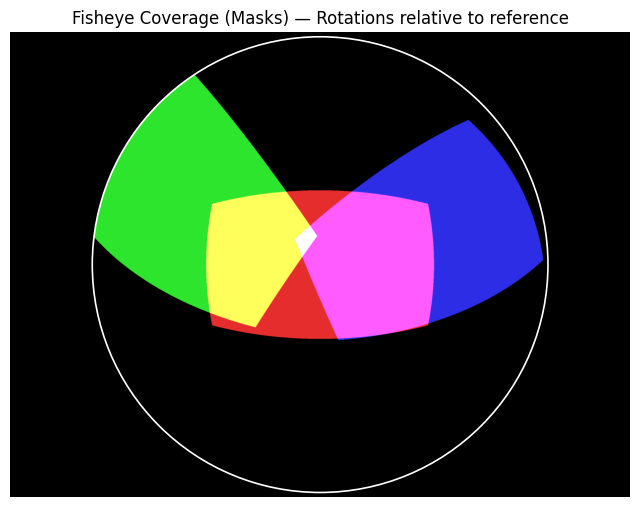

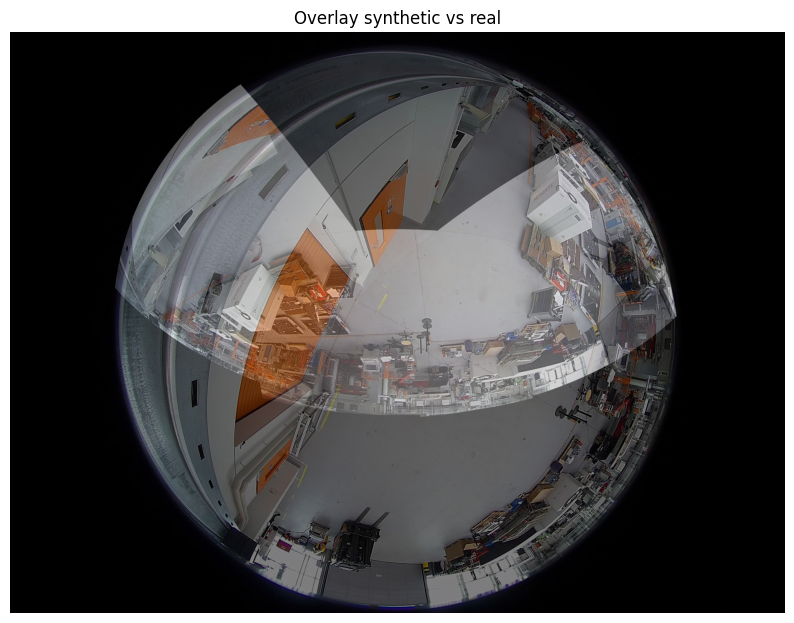

In [64]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as Rot

# -------------------------
# ASSUMPTIONS (set these before running)
# -------------------------
# 1) R_list: list of n_crops rotation matrices (3x3) from your BA (camera -> reference)
#    Example: R_list = [R0, R1, R2, R3] where R2 (reference idx) == identity
# 2) views: list of rect images (Wr x Hr) as float RGB in range [0,1]
#    Example load: views = [cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)/255.0 for p in crop_paths]
# 3) fisheye_img: the real fisheye RGB image as float [0,1], same geometry as fisheye_params below
#
# If you need to load from files, uncomment and adjust the two lines below:
# crop_paths = ["view1.jpg","view2.jpg","view3.jpg","view4.jpg"]
# views = [cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)/255.0 for p in crop_paths]
#
# Provide R_list from your BA (replace the placeholder below if necessary)
# R_list = [...]  # <- PUT YOUR BA rotation matrices HERE

# -------------------------
# FISHEYE PARAMETERS
# -------------------------
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# -------------------------
# Basic checks
# -------------------------
n_crops = len(R_list)
print(f"[info] n_crops = {n_crops}, views = {len(views)}")
# if len(views) != n_crops:
#     raise ValueError("Number of views must match number of rotations in R_list")

# Print rotation magnitudes (quick sanity)
print("Rotation magnitudes (deg) for BA R_list (camera -> reference):")
for i, Rm in enumerate(R_list):
    rv = Rot.from_matrix(Rm).as_rotvec(degrees=True)
    ang = np.linalg.norm(rv)
    print(f"  Cam {i}: angle = {ang:.3f} deg, rotvec = {rv}")

# -------------------------
# Utilities: pixel->ray conversions and precomputed fisheye grid
# -------------------------
Hf = fisheye_params["height"]
Wf = fisheye_params["width"]
cx_f = fisheye_params["cx"]
cy_f = fisheye_params["cy"]
radius = fisheye_params["radius"]
theta_max = fisheye_params["theta_max_rad"]

# fisheye pixel grid (reference frame rays)
xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
dx, dy = xs - cx_f, cy_f - ys
r = np.sqrt(dx**2 + dy**2)
theta = (r / radius) * theta_max
phi = np.arctan2(dy, dx)
sin_t = np.sin(theta)
ray_global = np.dstack((sin_t * np.cos(phi),
                        sin_t * np.sin(phi),
                        np.cos(theta)))  # Hf x Wf x 3

# -------------------------
# PROJECT: rect camera mask -> fisheye using BA rotations
# Use ray_local = ray_global @ R_cam  (camera->reference assumed in R_cam)
# -------------------------
def project_mask_to_fisheye(R_cam, Wr=1280, Hr=720):
    """
    R_cam : 3x3 rotation matrix (camera -> reference)
    returns : boolean mask (Hf x Wf) where the rect camera sees (valid pixels)
    """
    # map rays to camera frame (row-vector convention)
    ray_local = ray_global @ R_cam  # shape Hf x Wf x 3

    Xc = ray_local[..., 0]
    Yc = ray_local[..., 1]
    Zc = ray_local[..., 2]

    # rect intrinsics (90 deg FOV assumption)
    cx_r, cy_r = Wr / 2.0, Hr / 2.0
    f = (Wr / 2.0) / np.tan(np.deg2rad(90.0 / 2.0))

    u = f * (Xc / (Zc + 1e-12)) + cx_r
    v = f * (Yc / (Zc + 1e-12)) + cy_r

    valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)
    return valid

# -------------------------
# Visualize mask coverage per camera
# -------------------------
def visualize_masks_reference(R_list, fisheye_params):
    canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
    colors = [
        (1.0, 0.2, 0.2),
        (0.2, 1.0, 0.2),
        (0.2, 0.2, 1.0),
        (1.0, 1.0, 0.2),
        (0.2, 1.0, 1.0),
        (1.0, 0.2, 1.0)
    ]
    for i, R_cam in enumerate(R_list):
        mask = project_mask_to_fisheye(R_cam)
        color = np.array(colors[i % len(colors)], dtype=np.float32)
        # accumulate color — multiply by alpha for nicer overlap visibility
        canvas[mask] += color * 0.9

    # clip and zero outside circle
    yy, xx = np.mgrid[0:Hf, 0:Wf]
    circ_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
    canvas[~circ_mask] = 0.0
    canvas = np.clip(canvas, 0.0, 1.0)

    plt.figure(figsize=(8,8))
    plt.imshow(canvas)
    circ = plt.Circle((cx_f, cy_f), radius, color='white', fill=False, linewidth=1.2)
    plt.gca().add_patch(circ)
    plt.title("Fisheye Coverage (Masks) — Rotations relative to reference")
    plt.axis("off")
    plt.show()

# -------------------------
# Stitch textures into fisheye using BA rotations
# (wraps your earlier working projection; uses ray_global @ R_cam)
# -------------------------
def stitch_textures_reference(R_list, views, fisheye_params, Wr=1280, Hr=720):
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    fisheye_canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
    weight_mask = np.zeros((Hf, Wf, 1), dtype=np.float32)

    # rect intrinsics
    cx_r, cy_r = Wr / 2.0, Hr / 2.0
    f = (Wr / 2.0) / np.tan(np.deg2rad(90.0 / 2.0))

    for i, (R_cam, rect_img) in enumerate(zip(R_list, views)):
        print(f"[Warping] View {i} ...")
        # rotate rays to camera frame
        ray_local = ray_global @ R_cam  # Hf x Wf x 3

        Xc = ray_local[..., 0]
        Yc = ray_local[..., 1]
        Zc = ray_local[..., 2]

        u = f * (Xc / (Zc + 1e-12)) + cx_r
        v = f * (Yc / (Zc + 1e-12)) + cy_r

        valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)
        map_x = u.astype(np.float32)
        map_y = v.astype(np.float32)

        warped = cv2.remap((rect_img * 255).astype(np.uint8), map_x, map_y,
                           interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
        warped = warped.astype(np.float32) / 255.0

        mask = valid.astype(np.float32)[..., None]
        fisheye_canvas += warped * mask
        weight_mask += mask

    weight_mask[weight_mask == 0] = 1.0
    stitched = fisheye_canvas / weight_mask

    # outside circle -> black
    yy, xx = np.mgrid[0:Hf, 0:Wf]
    circle_mask = ((xx - cx_f)**2 + (yy - cy_f)**2) <= radius**2
    stitched[~circle_mask] = 0.0
    return stitched

# -------------------------
# Visualize masks
# -------------------------
visualize_masks_reference(R_list, fisheye_params)

# -------------------------
# Perform textured stitch and overlay (if views are provided)
# -------------------------
# try:
#     stitched = stitch_textures_reference(R_list, views, fisheye_params)
#     plt.figure(figsize=(10,10))
#     plt.imshow(np.clip(stitched, 0, 1))
#     plt.title("Stitched (BA Rotations)")
#     plt.axis("off")
#     plt.show()
# except Exception as e:
#     print("Could not stitch textures — ensure 'views' exists and matches R_list. Error:", e)

# -------------------------
# Overlay with real fisheye (if available)
# -------------------------
# Uncomment / set `fisheye_img` variable above (as float 0..1) if you want overlay:
try:
    overlay = 0.5 * stitched + 0.5 * fisheye_img
    plt.figure(figsize=(10,10))
    plt.imshow(np.clip(overlay, 0, 1))
    plt.title("Overlay synthetic vs real")
    plt.axis("off")
    plt.show()
except Exception as e:
    print("Overlay failed (missing stitched or fisheye_img). Error:", e)


Rotation magnitudes (deg) for BA R_list (camera -> reference):
Cam 0: angle = 0.000 deg, rotvec = [0. 0. 0.]
Cam 1: angle = 66.120 deg, rotvec = [ -3.58998915 -54.72895958 -36.92853701]
Cam 2: angle = 48.000 deg, rotvec = [1.37216055e-02 4.07059227e+01 2.54368149e+01]


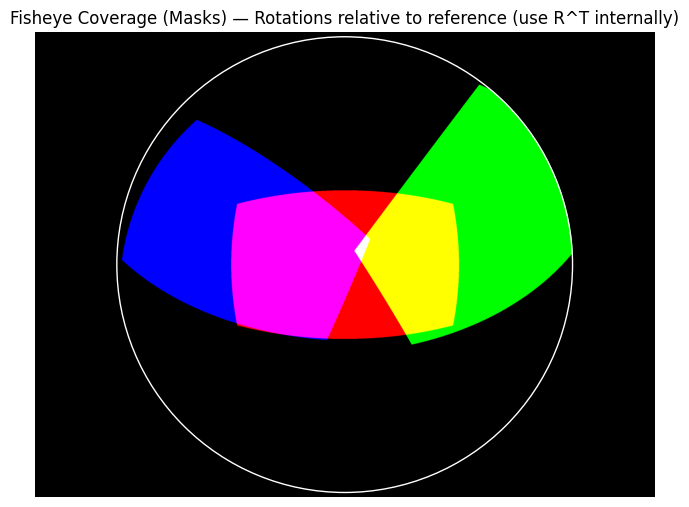

In [6]:
###########working

import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as Rot

# -------------------------
# Put your BA rotation matrices here (camera -> reference)
# Replace these sample matrices with your actual BA output matrices
# Camera 2 (reference) should be identity in your BA output.
R_list = R_list
# -------------------------
# Fisheye parameters (use your same numbers)
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# -------------------------
# Basic checks: print rotation magnitudes
print("Rotation magnitudes (deg) for BA R_list (camera -> reference):")
for i, Rm in enumerate(R_list):
    rv = Rot.from_matrix(Rm).as_rotvec(degrees=True)
    ang = np.linalg.norm(rv)
    axis = rv / (ang + 1e-12)
    print(f"Cam {i}: angle = {ang:.3f} deg, rotvec = {rv}")

# -------------------------
# Mask projection: project rect mask (90deg FOV) into fisheye using R_i^T
def project_mask_to_fisheye(R_cam, fisheye_params, Wr=1280, Hr=720):
    """
    R_cam: BA rotation matrix (camera -> reference).
    We compute ray_local = R_cam^T * ray_global (ray_global is in reference frame).
    Returns boolean mask (Hf x Wf) where rect camera sees.
    """
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    # rect intrinsics (pinhole 90deg)
    cx_r, cy_r = Wr / 2.0, Hr / 2.0
    f = (Wr / 2.0) / np.tan(np.deg2rad(90.0 / 2.0))

    # fisheye grid (reference frame)
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    ray_global = np.dstack((sin_t * np.cos(phi),
                            sin_t * np.sin(phi),
                            np.cos(theta)))  # shape Hf,Wf,3

    # Transform reference ray into camera frame: r_cam = R_cam^T * r_ref
    ray_local = ray_global @ R_cam.T  # (Hf,Wf,3)

    Xc = ray_local[..., 0]; Yc = ray_local[..., 1]; Zc = ray_local[..., 2]

    # Perspective projection into rect image
    u = f * (Xc / (Zc + 1e-12)) + cx_r
    v = f * (Yc / (Zc + 1e-12)) + cy_r

    valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)
    return valid

# -------------------------
# Visualize mask coverage (colored wedges)
def visualize_masks_reference(R_list, fisheye_params):
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx, cy, radius = fisheye_params["cx"], fisheye_params["cy"], fisheye_params["radius"]

    canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
    colors = [
        (1.0, 0.0, 0.0),
        (0.0, 1.0, 0.0),
        (0.0, 0.0, 1.0),
        (1.0, 1.0, 0.0),
        (0.0, 1.0, 1.0),
        (1.0, 0.0, 1.0)
    ]

    for i, R_cam in enumerate(R_list):
        mask = project_mask_to_fisheye(R_cam, fisheye_params)
        color = np.array(colors[i % len(colors)], dtype=np.float32)
        canvas[mask] += color  # accumulate

    # mask outside circle
    yy, xx = np.mgrid[0:Hf, 0:Wf]
    circ_mask = ((xx - cx)**2 + (yy - cy)**2) <= radius**2
    canvas[~circ_mask] = 0

    plt.figure(figsize=(8,8))
    plt.imshow(np.clip(canvas, 0, 1))
    circ = plt.Circle((cx, cy), radius, color='white', fill=False, linewidth=1)
    plt.gca().add_patch(circ)
    plt.title("Fisheye Coverage (Masks) — Rotations relative to reference (use R^T internally)")
    plt.axis("off")
    plt.show()

# -------------------------
# Optional: textured stitch using the same rotation direction
def stitch_textures_reference(R_list, views, fisheye_params, Wr=1280, Hr=720):
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    fisheye_canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
    weight_mask = np.zeros((Hf, Wf, 1), dtype=np.float32)

    # Precompute fisheye grid (global rays)
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    sin_t = np.sin(theta)
    phi = np.arctan2(dy, dx)
    ray_global = np.dstack((sin_t * np.cos(phi),
                            sin_t * np.sin(phi),
                            np.cos(theta)))

    f = (Wr / 2.0) / np.tan(np.deg2rad(90.0 / 2.0))
    cx_r, cy_r = Wr / 2.0, Hr / 2.0

    for i, (R_cam, rect_img) in enumerate(zip(R_list, views)):
        # rotate rays into camera frame
        ray_local = ray_global @ R_cam.T
        Xc = ray_local[..., 0]; Yc = ray_local[..., 1]; Zc = ray_local[..., 2]

        u = f * (Xc / (Zc + 1e-12)) + cx_r
        v = f * (Yc / (Zc + 1e-12)) + cy_r

        valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)
        warped = cv2.remap(rect_img, u.astype(np.float32), v.astype(np.float32),
                           interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)

        mask = valid.astype(np.float32)[..., None]
        fisheye_canvas += warped * mask
        weight_mask += mask

    weight_mask[weight_mask == 0] = 1.0
    stitched = fisheye_canvas / weight_mask

    # outside circle black
    stitched[~(((xs - cx_f)**2 + (ys - cy_f)**2) <= radius**2)] = 0
    return stitched

# -------------------------
# Run mask visualization
visualize_masks_reference(R_list, fisheye_params)

# -------------------------
# If you want texture stitch too, load your rect images (Wr x Hr)
# views should be list of rect images as float RGB 0..1 sized (1280,720)
# Example: replace with your actual image loading
# views = [cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)/255.0 for path in your_paths]
# stitched = stitch_textures_reference(R_list, views, fisheye_params)
# plt.figure(figsize=(10,10)); plt.imshow(stitched); plt.axis('off'); plt.show()


[Loaded] captures_yaw_pitch/capture1/view1_1.jpg  shape=(720, 1280, 3)
[Loaded] captures_yaw_pitch/capture1/view2_1.jpg  shape=(720, 1280, 3)
[Loaded] captures_yaw_pitch/capture1/view4_1.jpg  shape=(720, 1280, 3)
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...


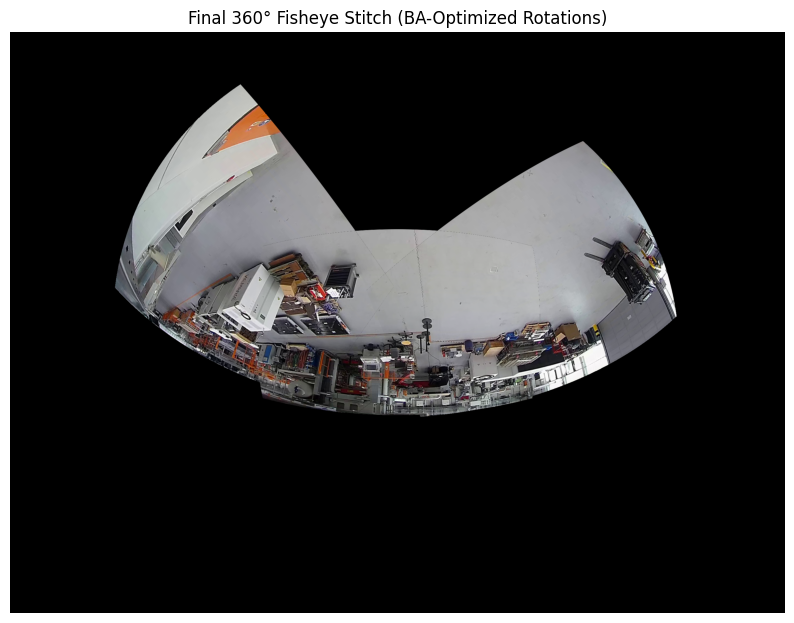

✅ Saved fisheye_stitched_ba.jpg


In [5]:

###working

import cv2
import numpy as np
import matplotlib.pyplot as plt

# ================================================================
# 1️⃣ Load your rect images (each 1280×720)
# ================================================================
crop_paths = [
    "captures_yaw_pitch/capture1/view1_1.jpg",
    "captures_yaw_pitch/capture1/view2_1.jpg",
    "captures_yaw_pitch/capture1/view4_1.jpg"
]

views = [cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB) / 255.0 for p in crop_paths]

for i, v in enumerate(views):
    if v is None:
        raise FileNotFoundError(f"❌ Missing image: {crop_paths[i]}")
    print(f"[Loaded] {crop_paths[i]}  shape={v.shape}")

# ================================================================
# 2️⃣ Fisheye stitch using R_list and correct projection geometry
# ================================================================
def stitch_textures_reference(R_list, views, fisheye_params, Wr=1280, Hr=720):
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    fisheye_canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
    weight_mask = np.zeros((Hf, Wf, 1), dtype=np.float32)

    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    sin_t = np.sin(theta)
    phi = np.arctan2(dy, dx)
    ray_global = np.dstack((sin_t * np.cos(phi),
                            sin_t * np.sin(phi),
                            np.cos(theta)))

    f = (Wr / 2.0) / np.tan(np.deg2rad(90.0 / 2.0))
    cx_r, cy_r = Wr / 2.0, Hr / 2.0

    for i, (R_cam, rect_img) in enumerate(zip(R_list, views)):
        print(f"[Warping] View {i} ...")

        # ✅ FIX: use R_cam, not R_cam.T
        ray_local = ray_global @ R_cam
        Xc = ray_local[..., 0]
        Yc = ray_local[..., 1]
        Zc = ray_local[..., 2]

        u = f * (Xc / (Zc + 1e-12)) + cx_r
        v = f * (Yc / (Zc + 1e-12)) + cy_r

        valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)
        warped = cv2.remap(rect_img, u.astype(np.float32), v.astype(np.float32),
                           interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)

        mask = valid.astype(np.float32)[..., None]
        fisheye_canvas += warped * mask
        weight_mask += mask

    weight_mask[weight_mask == 0] = 1.0
    stitched = fisheye_canvas / weight_mask

    stitched[((xs - cx_f)**2 + (ys - cy_f)**2) > radius**2] = 0
    return stitched
# ================================================================
# 3️⃣ Run stitching
# ================================================================
stitched = stitch_textures_reference(R_list, views, fisheye_params)

# ================================================================
# 4️⃣ Show and save result
# ================================================================
plt.figure(figsize=(10,10))
plt.imshow(np.clip(stitched, 0, 1))
plt.title("Final 360° Fisheye Stitch (BA-Optimized Rotations)")
plt.axis("off")
plt.show()


print("✅ Saved fisheye_stitched_ba.jpg")


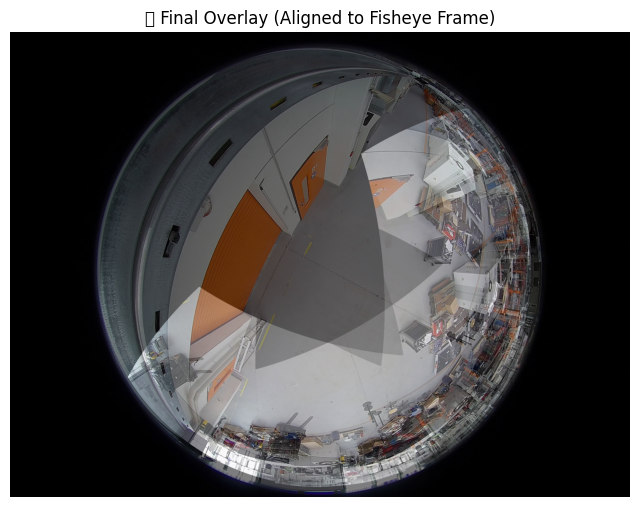

In [67]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# =====================================================
# FISHEYE PARAMETERS
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708  # 90° fisheye half-FOV
}

# =====================================================
# LOAD IMAGES
# =====================================================
crop_paths = [
    "captures_yaw_pitch/capture1/view1_1.jpg",
    "captures_yaw_pitch/capture1/view2_1.jpg",
    "captures_yaw_pitch/capture1/view4_1.jpg"
]

fisheye_img = cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg") 
fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB) / 255.0
views = [cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB) / 255.0 for p in crop_paths]

# =====================================================
# BA-OPTIMIZED ROTATIONS (camera → reference)
# =====================================================
R_list = R_list

# =====================================================
# STITCH FUNCTION
# =====================================================
def stitch_textures_reference(R_list_global, views, fish):
    Hf, Wf = fish["height"], fish["width"]
    cx, cy, radius, theta_max = fish["cx"], fish["cy"], fish["radius"], fish["theta_max_rad"]
    canvas = np.zeros((Hf, Wf, 3), np.float32)
    count = np.zeros((Hf, Wf, 1), np.float32)

    # Generate fisheye rays (unit sphere coordinates)
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx, cy - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    ray_global = np.stack([
        np.sin(theta) * np.cos(phi),
        np.sin(theta) * np.sin(phi),
        np.cos(theta)
    ], axis=-1)

    Hr, Wr = 720, 1280  # rectilinear view size
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(90 / 2))  # FOV ~90°

    for view, R_cam in zip(views, R_list_global):
        # ✅ Correct transformation: global → local (camera frame)
        ray_local = ray_global @ R_cam  # camera→reference, so global→local uses R_cam

        X, Y, Z = ray_local[..., 0], ray_local[..., 1], ray_local[..., 2]
        u = f * (X / (Z + 1e-6)) + cx_r
        v = f * (Y / (Z + 1e-6)) + cy_r
        valid = (u >= 0) & (u < Wr) & (v >= 0) & (Z > 0)

        remap = cv2.remap(view, u.astype(np.float32), v.astype(np.float32),
                          cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
        canvas[valid] += remap[valid]
        count[valid] += 1

    count[count == 0] = 1
    return canvas / count

# =====================================================
# Y-AXIS FLIP (fix handedness)
# =====================================================
R_flipY = np.diag([1, -1, 1])

# Apply flip to all rotations (camera→reference)
R_list_global = [R_flipY @ R_i for R_i in R_list]

# =====================================================
# OPTIONAL GLOBAL ROTATION (if still tilted)
# =====================================================
# Try uncommenting one of these if needed:
# R_yaw90 = R.from_euler('z', 90, degrees=True).as_matrix()
# R_pitch90 = R.from_euler('x', 90, degrees=True).as_matrix()
# R_roll180 = R.from_euler('z', 180, degrees=True).as_matrix()
# R_list_global = [R_yaw90 @ R_i for R_i in R_list_global]

# =====================================================
# STITCH AND OVERLAY
# =====================================================
stitched_corrected = stitch_textures_reference(R_list_global, views, fisheye_params)
# Step 1: apply handedness and fisheye-to-ref rotation
R_ref_corrected = R_flipY @ R_ref_est

# Step 2: convert each camera rotation into fisheye frame
R_list_global = [R_ref_corrected @ R_i for R_i in R_list]

# Step 3: stitch using the *global* rotations
stitched_corrected = stitch_textures_reference(R_list_global, views, fisheye_params)

# Step 4: overlay with real fisheye
overlay = 0.5 * stitched_corrected + 0.5 * fisheye_img
plt.figure(figsize=(8, 8))
plt.imshow(np.clip(overlay, 0, 1))
plt.title("✅ Final Overlay (Aligned to Fisheye Frame)")
plt.axis("off")
plt.show()


[Refine] Running SIFT + Kabsch rigid alignment...
[Kabsch] Estimated correction rotation:
[[-0.2965005   0.5116146   0.8064353 ]
 [-0.9550282  -0.15623711 -0.2520142 ]
 [-0.00293903 -0.84489083  0.5349307 ]]


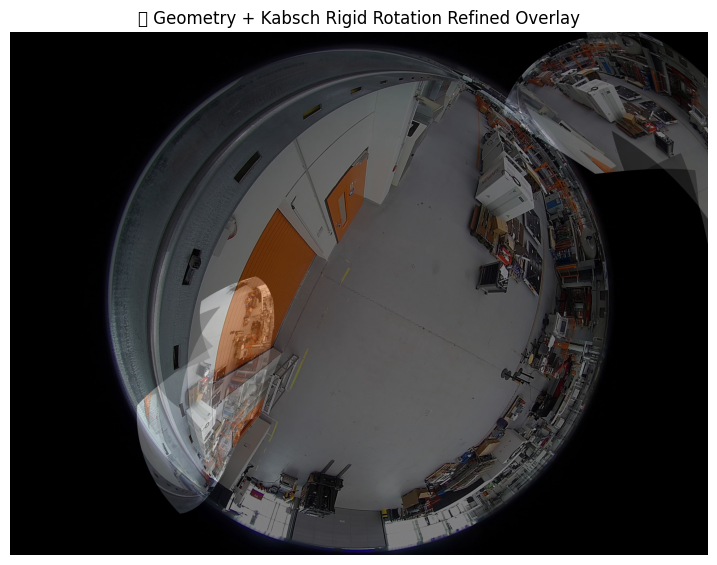

In [70]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# =====================================================
# FISHEYE PARAMETERS
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708  # 90° fisheye half-FOV
}

# =====================================================
# LOAD IMAGES
# =====================================================
crop_paths = [
    "captures_yaw_pitch/capture1/view1_1.jpg",
    "captures_yaw_pitch/capture1/view2_1.jpg",
    "captures_yaw_pitch/capture1/view4_1.jpg"
]

fisheye_img = cv2.cvtColor(cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg"), cv2.COLOR_BGR2RGB) / 255.0
views = [cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB) / 255.0 for p in crop_paths]

# =====================================================
# BA-OPTIMIZED ROTATIONS (camera → reference)
# =====================================================
R_list = R_list  # <-- your BA output
R_ref_est = np.eye(3)  # (if you have a ref rotation, replace here)

# =====================================================
# STITCH FUNCTION (geometry-based)
# =====================================================
def stitch_textures_reference(R_list_global, views, fish):
    Hf, Wf = fish["height"], fish["width"]
    cx, cy, radius, theta_max = fish["cx"], fish["cy"], fish["radius"], fish["theta_max_rad"]
    canvas = np.zeros((Hf, Wf, 3), np.float32)
    count = np.zeros((Hf, Wf, 1), np.float32)

    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx, cy - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    ray_global = np.stack([
        np.sin(theta) * np.cos(phi),
        np.sin(theta) * np.sin(phi),
        np.cos(theta)
    ], axis=-1)

    Hr, Wr = 720, 1280
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(90 / 2))

    for view, R_cam in zip(views, R_list_global):
        ray_local = ray_global @ R_cam
        X, Y, Z = ray_local[..., 0], ray_local[..., 1], ray_local[..., 2]
        u = f * (X / (Z + 1e-6)) + cx_r
        v = f * (Y / (Z + 1e-6)) + cy_r
        valid = (u >= 0) & (u < Wr) & (v >= 0) & (Z > 0)

        remap = cv2.remap(view, u.astype(np.float32), v.astype(np.float32),
                          cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
        canvas[valid] += remap[valid]
        count[valid] += 1

    count[count == 0] = 1
    return canvas / count

# =====================================================
# STEP 1 — Prepare rotations and geometric stitch
# =====================================================
R_flipY = np.diag([1, -1, 1])
R_list_global = [R_flipY @ R_i for R_i in R_list]
R_ref_corrected = R_flipY @ R_ref_est
R_list_global = [R_ref_corrected @ R_i for R_i in R_list]

stitched_geom = stitch_textures_reference(R_list_global, views, fisheye_params)

# =====================================================
# STEP 2 — SIFT + KABSCH REFINEMENT (Rotation-only)
# =====================================================
def refine_alignment_kabsch(warped_geom, fisheye_img, fisheye_params):
    """Refine alignment using SIFT feature correspondences and Kabsch rotation (no warping distortion)."""
    print("[Refine] Running SIFT + Kabsch rigid alignment...")

    # Step 1: Detect SIFT features on both images
    gray1 = cv2.cvtColor((warped_geom * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor((fisheye_img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)

    if des1 is None or des2 is None or len(kp1) < 8 or len(kp2) < 8:
        print("❌ Not enough keypoints for alignment.")
        return warped_geom

    # Step 2: Match keypoints
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)
    good = [m for m, n in matches if m.distance < 0.75 * n.distance]

    if len(good) < 8:
        print("❌ Not enough matches after ratio test.")
        return warped_geom

    pts1 = np.float32([kp1[m.queryIdx].pt for m in good])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good])

    # Step 3: Convert pixel coordinates -> normalized fisheye rays
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx, cy = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    def pixels_to_rays(pts):
        dx, dy = pts[:, 0] - cx, cy - pts[:, 1]
        r = np.sqrt(dx**2 + dy**2)
        theta = (r / radius) * theta_max
        phi = np.arctan2(dy, dx)
        sin_t = np.sin(theta)
        return np.stack([sin_t * np.cos(phi), sin_t * np.sin(phi), np.cos(theta)], axis=-1)

    rays1 = pixels_to_rays(pts1)
    rays2 = pixels_to_rays(pts2)

    # Step 4: Compute Kabsch rotation (R_best minimizes ||R*rays1 - rays2||)
    mu1 = rays1.mean(axis=0)
    mu2 = rays2.mean(axis=0)
    X = rays1 - mu1
    Y = rays2 - mu2
    H = X.T @ Y
    U, _, Vt = np.linalg.svd(H)
    R_best = Vt.T @ U.T
    if np.linalg.det(R_best) < 0:
        Vt[-1, :] *= -1
        R_best = Vt.T @ U.T

    print("[Kabsch] Estimated correction rotation:")
    print(R_best)

    # Step 5: Reproject stitched image using this new rotation
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx, cy, radius, theta_max = cx, cy, radius, theta_max
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx, cy - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    ray_fish = np.stack([sin_t * np.cos(phi), sin_t * np.sin(phi), np.cos(theta)], axis=-1)

    # Apply refined rotation
    ray_refined = ray_fish @ R_best.T
    X, Y, Z = ray_refined[..., 0], ray_refined[..., 1], ray_refined[..., 2]

    Wr, Hr = 1280, 720
    f = (Wr / 2) / np.tan(np.deg2rad(90 / 2))
    cx_r, cy_r = Wr / 2, Hr / 2
    u = f * (X / (Z + 1e-12)) + cx_r
    v = f * (Y / (Z + 1e-12)) + cy_r

    map_x, map_y = u.astype(np.float32), v.astype(np.float32)
    refined = cv2.remap((warped_geom * 255).astype(np.uint8), map_x, map_y,
                        interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    refined = refined.astype(np.float32) / 255.0
    return refined

# =====================================================
# RUN REFINEMENT
# =====================================================
stitched_refined = refine_alignment_kabsch(stitched_geom, fisheye_img, fisheye_params)

# =====================================================
# FINAL OVERLAY
# =====================================================
overlay_rigid = 0.5 * fisheye_img + 0.5 * stitched_refined
plt.figure(figsize=(9,9))
plt.imshow(np.clip(overlay_rigid, 0, 1))
plt.title("✅ Geometry + Kabsch Rigid Rotation Refined Overlay")
plt.axis("off")
plt.show()

[Refine] Running SIFT + Kabsch rigid rotation estimation...
[Kabsch] Mean angular error: 2.32°
[INFO] Kabsch correction matrix:
 [[-0.2965005   0.5116146   0.8064353 ]
 [-0.9550282  -0.15623711 -0.2520142 ]
 [-0.00293903 -0.84489083  0.5349307 ]]


c:\Users\Nahush\anaconda3\envs\test_env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


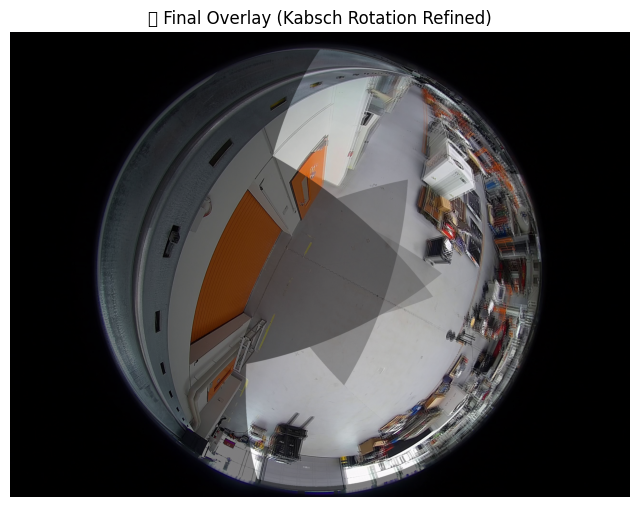

In [6]:


#######################working
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# =====================================================
# FISHEYE PARAMETERS
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708  # 90° fisheye half-FOV
}

# =====================================================
# LOAD IMAGES
# =====================================================
crop_paths = [
    "captures_yaw_pitch/capture1/view1_1.jpg",
    "captures_yaw_pitch/capture1/view2_1.jpg",
    "captures_yaw_pitch/capture1/view4_1.jpg"
]

fisheye_img = cv2.cvtColor(cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg"), cv2.COLOR_BGR2RGB) / 255.0
views = [cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB) / 255.0 for p in crop_paths]

# =====================================================
# BA-OPTIMIZED ROTATIONS (camera → reference)
# =====================================================
R_list = R_list
R_ref_est = np.eye(3)  # Replace if you have a specific reference rotation

# =====================================================
# STITCH FUNCTION
# =====================================================
def stitch_textures_reference(R_list_global, views, fish):
    Hf, Wf = fish["height"], fish["width"]
    cx, cy, radius, theta_max = fish["cx"], fish["cy"], fish["radius"], fish["theta_max_rad"]
    canvas = np.zeros((Hf, Wf, 3), np.float32)
    count = np.zeros((Hf, Wf, 1), np.float32)

    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx, cy - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    ray_global = np.stack([
        np.sin(theta) * np.cos(phi),
        np.sin(theta) * np.sin(phi),
        np.cos(theta)
    ], axis=-1)

    Hr, Wr = 720, 1280  # rectilinear view size
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(90 / 2))

    for view, R_cam in zip(views, R_list_global):
        ray_local = ray_global @ R_cam
        X, Y, Z = ray_local[..., 0], ray_local[..., 1], ray_local[..., 2]
        u = f * (X / (Z + 1e-6)) + cx_r
        v = f * (Y / (Z + 1e-6)) + cy_r
        valid = (u >= 0) & (u < Wr) & (v >= 0) & (Z > 0)
        remap = cv2.remap(view, u.astype(np.float32), v.astype(np.float32),
                          cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
        canvas[valid] += remap[valid]
        count[valid] += 1

    count[count == 0] = 1
    return canvas / count

# =====================================================
# KABSCH REFINEMENT (SIFT-BASED RIGID ALIGNMENT)
# =====================================================
def kabsch_refine_rotation(stitched_img, fisheye_img, fisheye_params):
    """Estimate a rigid rotation between stitched image and fisheye using SIFT + Kabsch."""
    print("[Refine] Running SIFT + Kabsch rigid rotation estimation...")

    # Step 1 — Detect SIFT keypoints
    gray1 = cv2.cvtColor((stitched_img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor((fisheye_img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)
    if des1 is None or des2 is None or len(kp1) < 8 or len(kp2) < 8:
        print("❌ Not enough keypoints for Kabsch.")
        return np.eye(3)

    # Step 2 — Match features
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)
    good = [m for m, n in matches if m.distance < 0.75 * n.distance]
    if len(good) < 8:
        print("❌ Not enough good matches for Kabsch.")
        return np.eye(3)

    pts1 = np.float32([kp1[m.queryIdx].pt for m in good])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good])

    # Step 3 — Convert pixel to rays
    cx, cy, radius, theta_max = fisheye_params["cx"], fisheye_params["cy"], fisheye_params["radius"], fisheye_params["theta_max_rad"]
    def pix2ray(pts):
        dx, dy = pts[:, 0] - cx, cy - pts[:, 1]
        r = np.sqrt(dx**2 + dy**2)
        theta = (r / radius) * theta_max
        phi = np.arctan2(dy, dx)
        sin_t = np.sin(theta)
        return np.stack([sin_t * np.cos(phi), sin_t * np.sin(phi), np.cos(theta)], axis=-1)

    rays1 = pix2ray(pts1)
    rays2 = pix2ray(pts2)

    # Step 4 — Apply Kabsch (rigid 3D rotation)
    mu1, mu2 = rays1.mean(axis=0), rays2.mean(axis=0)
    X, Y = rays1 - mu1, rays2 - mu2
    H = X.T @ Y
    U, _, Vt = np.linalg.svd(H)
    R_best = Vt.T @ U.T
    if np.linalg.det(R_best) < 0:
        Vt[-1, :] *= -1
        R_best = Vt.T @ U.T

    # Optional diagnostic
    err = np.degrees(np.arccos(np.clip(np.sum((rays1 @ R_best.T) * rays2, axis=1), -1, 1)))
    print(f"[Kabsch] Mean angular error: {err.mean():.2f}°")

    return R_best

# =====================================================
# STEP 1 — Prepare initial rotations
# =====================================================
R_flipY = np.diag([1, -1, 1])
R_list_global = [R_flipY @ R_i for R_i in R_list]
R_ref_corrected = R_flipY @ R_ref_est
R_list_global = [R_ref_corrected @ R_i for R_i in R_list]

# =====================================================
# STEP 2 — Initial geometry-based stitch
# =====================================================
stitched_geom = stitch_textures_reference(R_list_global, views, fisheye_params)

# =====================================================
# STEP 3 — Apply Kabsch rotation refinement
# =====================================================
R_corr = kabsch_refine_rotation(stitched_geom, fisheye_img, fisheye_params)
print("[INFO] Kabsch correction matrix:\n", R_corr)

# Update global reference rotation
R_ref_corrected = R_corr @ R_ref_corrected
R_list_global = [R_ref_corrected @ R_i for R_i in R_list]

# =====================================================
# STEP 4 — Final stitch and overlay (Kabsch refined)
# =====================================================
stitched_corrected = stitch_textures_reference(R_list_global, views, fisheye_params)
overlay = 0.5 * stitched_corrected + 0.5 * fisheye_img

plt.figure(figsize=(8, 8))
plt.imshow(np.clip(overlay, 0, 1))
plt.title("✅ Final Overlay (Kabsch Rotation Refined)")
plt.axis("off")
plt.show()


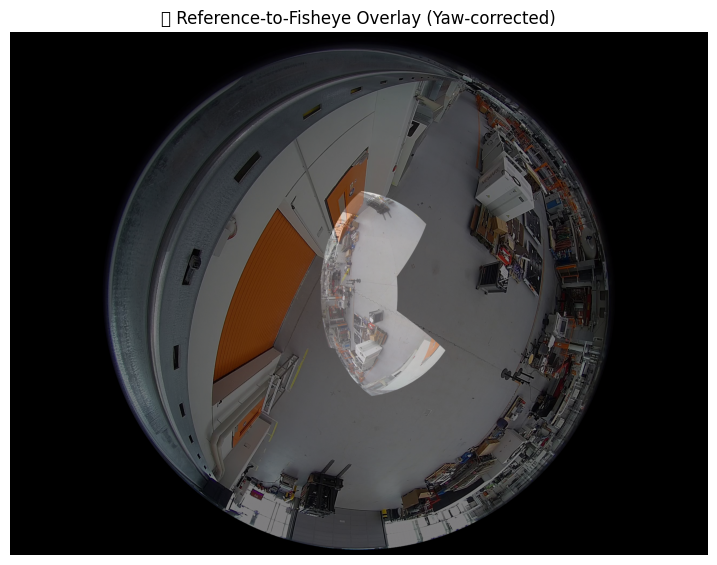

In [68]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# =====================================================
# 1️⃣ FISHEYE PARAMETERS
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708  # 90° fisheye half-FOV
}

# =====================================================
# 2️⃣ LOAD FISHEYE + STITCHED IMAGE
# =====================================================
fisheye_img = cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg")
fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB) / 255.0

# stitched: your result from BA-based rectilinear stitching
# (already loaded or produced earlier)
# stitched = cv2.cvtColor(cv2.imread("stitched_reference.jpg"), cv2.COLOR_BGR2RGB) / 255.0

# =====================================================
# 3️⃣ DEFINE FISHEYE RAY GRID
# =====================================================
Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx, cy = fisheye_params["cx"], fisheye_params["cy"]
radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
dx, dy = xs - cx, cy - ys
r = np.sqrt(dx**2 + dy**2)
theta = (r / radius) * theta_max
phi = np.arctan2(dy, dx)
sin_t = np.sin(theta)

# Ray directions (fisheye frame → world reference)
ray_fisheye = np.stack([
    sin_t * np.cos(phi),
    sin_t * np.sin(phi),
    np.cos(theta)
], axis=-1)

# =====================================================
# 4️⃣ (OPTIONAL) APPLY GLOBAL ALIGNMENT CORRECTION
# =====================================================
# If you notice yaw (left/right) offset, apply here:
yaw_correction_deg = -90  # adjust until alignment visually correct
R_yaw_corr = R.from_euler('z', yaw_correction_deg, degrees=True).as_matrix()

# rotate fisheye rays into reference (stitched) frame
ray_ref = ray_fisheye @ R_yaw_corr.T

# =====================================================
# 5️⃣ PROJECT FISHEYE RAYS INTO REFERENCE (stitched) IMAGE
# =====================================================
Wr, Hr = stitched.shape[1], stitched.shape[0]
cx_r, cy_r = Wr / 2.0, Hr / 2.0
f = (Wr / 2.0) / np.tan(np.deg2rad(90.0 / 2.0))

X, Y, Z = ray_ref[..., 0], ray_ref[..., 1], ray_ref[..., 2]
u = f * (X / (Z + 1e-12)) + cx_r
v = f * (Y / (Z + 1e-12)) + cy_r

map_x = u.astype(np.float32)
map_y = v.astype(np.float32)

# =====================================================
# 6️⃣ REMAP STITCHED → FISHEYE FRAME
# =====================================================
warped_ref_to_fish = cv2.remap(
    (stitched * 255).astype(np.uint8),
    map_x,
    map_y,
    cv2.INTER_LINEAR,
    borderMode=cv2.BORDER_CONSTANT
).astype(np.float32) / 255.0

# Mask outside fisheye circle
mask = ((xs - cx)**2 + (ys - cy)**2) <= radius**2
mask = mask[..., None].astype(np.float32)

# =====================================================
# 7️⃣ COMBINE OVERLAY
# =====================================================
overlay = 0.5 * warped_ref_to_fish * mask + 0.5 * fisheye_img * mask

# =====================================================
# 8️⃣ DISPLAY RESULT
# =====================================================
plt.figure(figsize=(9, 9))
plt.imshow(np.clip(overlay, 0, 1))
plt.title("✅ Reference-to-Fisheye Overlay (Yaw-corrected)")
plt.axis("off")
plt.show()


In [42]:
fs = cv2.imread("20251028_164444 (1).png")

c:\Users\Nahush\anaconda3\envs\test_env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


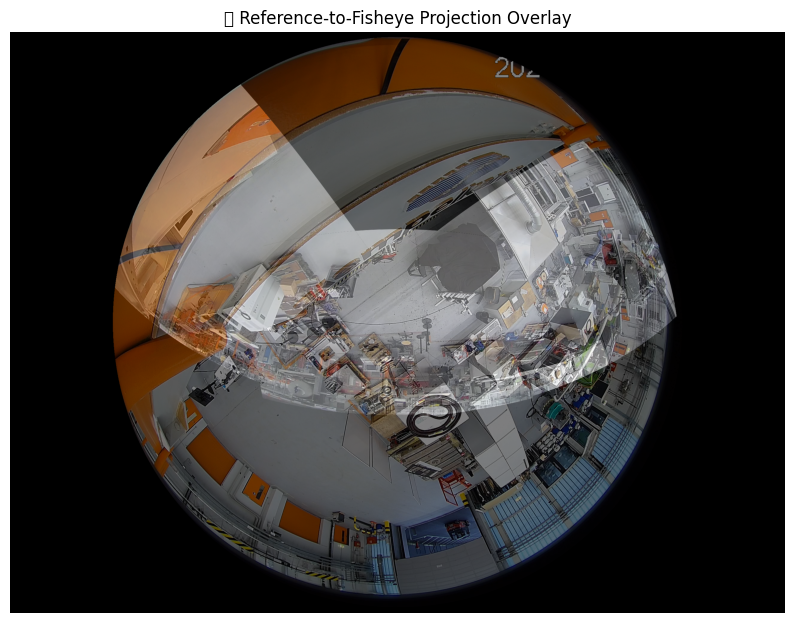

In [59]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# --------------------------------------------
# Inputs
# --------------------------------------------
fisheye_img = cv2.cvtColor(fs, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# stitched = result from your previous BA-based stitching (reference plane)
# e.g. stitched.shape == (1944, 2592, 3)
# If you have it in memory, just reuse it; else load saved version:
# stitched = cv2.cvtColor(cv2.imread("fisheye_stitched_ba.jpg"), cv2.COLOR_BGR2RGB).astype(np.float32)/255.0

# --------------------------------------------
# Build pixel-to-ray map for fisheye
# --------------------------------------------
Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx, cy, radius, theta_max = (
    fisheye_params["cx"],
    fisheye_params["cy"],
    fisheye_params["radius"],
    fisheye_params["theta_max_rad"],
)

xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
dx, dy = xs - cx, cy - ys
r = np.sqrt(dx**2 + dy**2)
theta = (r / radius) * theta_max
phi = np.arctan2(dy, dx)
sin_t = np.sin(theta)
ray_fisheye = np.stack([sin_t * np.cos(phi), sin_t * np.sin(phi), np.cos(theta)], axis=-1)

# --------------------------------------------
# Reference → Fisheye projection (identity here, since already in reference)
# If you had an extra R_ref, apply: ray_ref = R_ref.T @ ray_fisheye
# --------------------------------------------
ray_ref = ray_fisheye  # same orientation

# Map rays back to fisheye pixel coordinates
X, Y, Z = ray_ref[..., 0], ray_ref[..., 1], ray_ref[..., 2]
theta2 = np.arccos(np.clip(Z, -1, 1))
phi2 = np.arctan2(Y, X)
r2 = (theta2 / theta_max) * radius
u2 = cx + r2 * np.cos(phi2)
v2 = cy - r2 * np.sin(phi2)

# --------------------------------------------
# Remap the synthetic stitch to the fisheye frame
# --------------------------------------------
map_x = u2.astype(np.float32)
map_y = v2.astype(np.float32)

warped_ref_to_fish = cv2.remap(
    (stitched * 255).astype(np.uint8),
    map_x,
    map_y,
    cv2.INTER_LINEAR,
    borderMode=cv2.BORDER_CONSTANT,
)
warped_ref_to_fish = warped_ref_to_fish.astype(np.float32) / 255.0

# Mask outside fisheye circle
mask = ((xs - cx)**2 + (ys - cy)**2) <= radius**2
mask = mask[..., None].astype(np.float32)

# --------------------------------------------
# Combine with real fisheye (visual overlay)
# --------------------------------------------
overlay = 0.5 * warped_ref_to_fish * mask + 0.5 * fisheye_img * mask

# --------------------------------------------
# Display results
# --------------------------------------------
plt.figure(figsize=(10, 10))
plt.imshow(np.clip(overlay, 0, 1))
plt.title("✅ Reference-to-Fisheye Projection Overlay")
plt.axis("off")
plt.show()


In [44]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# --------------------------------------------
# Inputs
# --------------------------------------------
fisheye_img = cv2.cvtColor(fs, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# stitched = result from your previous BA-based stitching (reference plane)
# stitched = cv2.cvtColor(cv2.imread("fisheye_stitched_ba.jpg"), cv2.COLOR_BGR2RGB).astype(np.float32)/255.0

# --------------------------------------------
# Build pixel-to-ray map for fisheye
# --------------------------------------------
Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx, cy, radius, theta_max = (
    fisheye_params["cx"],
    fisheye_params["cy"],
    fisheye_params["radius"],
    fisheye_params["theta_max_rad"],
)

xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
dx, dy = xs - cx, cy - ys
r = np.sqrt(dx**2 + dy**2)
theta = (r / radius) * theta_max
phi = np.arctan2(dy, dx)
sin_t = np.sin(theta)
ray_fisheye = np.stack([sin_t * np.cos(phi), sin_t * np.sin(phi), np.cos(theta)], axis=-1)

# --------------------------------------------
# Helper: Apply small yaw/pitch correction
# --------------------------------------------
def apply_rotation(ray, yaw_deg, pitch_deg):
    R_corr = R.from_euler("zyx", [yaw_deg, pitch_deg, 0.0], degrees=True).as_matrix()
    ray_rot = (R_corr @ ray.reshape(-1, 3).T).T.reshape(ray.shape)
    return ray_rot

# --------------------------------------------
# Helper: Project synthetic stitch onto fisheye
# --------------------------------------------
def project_to_fisheye(ray_ref):
    X, Y, Z = ray_ref[..., 0], ray_ref[..., 1], ray_ref[..., 2]
    theta2 = np.arccos(np.clip(Z, -1, 1))
    phi2 = np.arctan2(Y, X)
    r2 = (theta2 / theta_max) * radius
    u2 = cx + r2 * np.cos(phi2)
    v2 = cy - r2 * np.sin(phi2)

    map_x = u2.astype(np.float32)
    map_y = v2.astype(np.float32)

    warped = cv2.remap(
        (stitched * 255).astype(np.uint8),
        map_x,
        map_y,
        cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT,
    )
    return warped.astype(np.float32) / 255.0

# --------------------------------------------
# Helper: NCC scoring
# --------------------------------------------
def compute_ncc(img1, img2):
    gray1 = cv2.cvtColor((img1 * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor((img2 * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    gray2 = cv2.resize(gray2, (gray1.shape[1], gray1.shape[0]))
    score = cv2.matchTemplate(gray1, gray2, cv2.TM_CCOEFF_NORMED)
    return score[0][0]

# --------------------------------------------
# Automatic alignment search
# --------------------------------------------
yaw_range = np.linspace(-10, 10, 21)   # ±10° range
pitch_range = np.linspace(-10, 10, 21)
best_score = -1
best_yaw, best_pitch = 0.0, 0.0

print("🔍 Searching optimal yaw/pitch alignment...")

for yaw in yaw_range:
    for pitch in pitch_range:
        ray_rot = apply_rotation(ray_fisheye, yaw, pitch)
        warped = project_to_fisheye(ray_rot)
        score = compute_ncc(warped, fisheye_img)
        if score > best_score:
            best_score = score
            best_yaw, best_pitch = yaw, pitch

print(f"\n✅ Best alignment:")
print(f"   Yaw   = {best_yaw:.2f}°")
print(f"   Pitch = {best_pitch:.2f}°")
print(f"   NCC score = {best_score:.4f}")

# --------------------------------------------
# Apply best correction
# --------------------------------------------
ray_ref = apply_rotation(ray_fisheye, best_yaw, best_pitch)
warped_ref_to_fish = project_to_fisheye(ray_ref)

# Mask outside fisheye circle
mask = ((xs - cx)**2 + (ys - cy)**2) <= radius**2
mask = mask[..., None].astype(np.float32)

# Combine with real fisheye (visual overlay)
overlay = 0.5 * warped_ref_to_fish * mask + 0.5 * fisheye_img * mask

# --------------------------------------------
# Display final result
# --------------------------------------------
plt.figure(figsize=(10, 10))
plt.imshow(np.clip(overlay, 0, 1))
plt.title(f"✅ Auto-Aligned Reference-to-Fisheye Overlay\nYaw={best_yaw:.2f}°, Pitch={best_pitch:.2f}°")
plt.axis("off")
plt.show()


🔍 Searching optimal yaw/pitch alignment...


KeyboardInterrupt: 

[INFO] Estimating R_ref→fisheye using photometric alignment...
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.3210e+05                                    3.07e+05    
       1              2         1.3210e+05      5.28e+00       2.80e-04       3.03e+05    
       2              3         1.3210e+05      1.23e+00       6.99e-05       3.03e+05    
       3              4         1.3209e+05      7.17e-01       1.75e-05       3.03e+05    
       4              5         1.3209e+05      2.30e-02       4.37e-06       3.02e+05    
       5              6         1.3209e+05      2.55e-01       1.09e-06       3.00e+05    
       6             15         1.3209e+05      4.80e-04       1.67e-11       3.00e+05    
`ftol` termination condition is satisfied.
Function evaluations 15, initial cost 1.3210e+05, final cost 1.3209e+05, first-order optimality 3.00e+05.
Optimized R_ref→fisheye rotvec (deg): [0.01341495 0.01481912

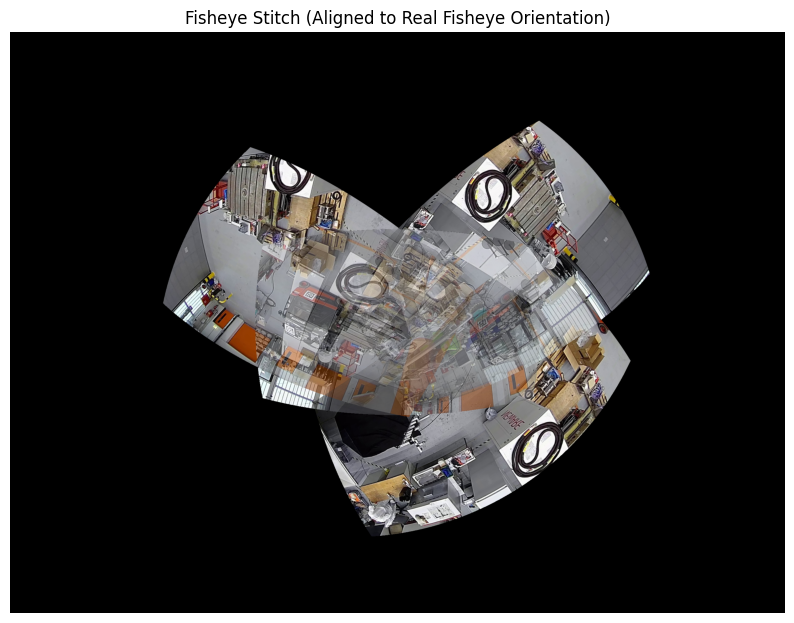

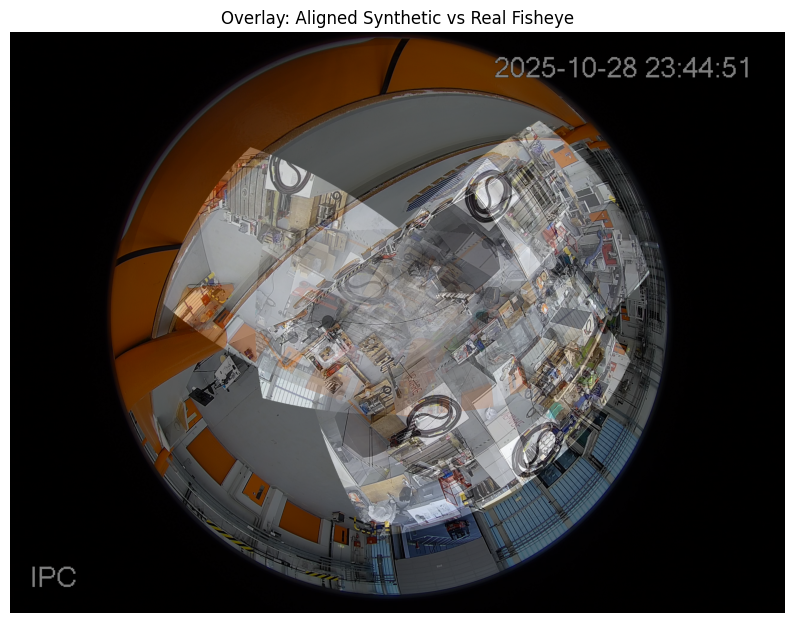

In [21]:
import numpy as np
import cv2
from scipy.optimize import least_squares
from scipy.spatial.transform import Rotation as R
import matplotlib.pyplot as plt

# -------------------------------
# LOAD FISHEYE IMAGE
# -------------------------------
fisheye_img = cv2.imread("20251028_164444 (1).png")
fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB) / 255.0
Hf, Wf, _ = fisheye_img.shape
fisheye_gray = cv2.cvtColor((fisheye_img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0

# -------------------------------
# FISHEYE GEOMETRY
# -------------------------------
fisheye_params = {
    "width": Wf,
    "height": Hf,
    "cx": Wf / 2,
    "cy": Hf / 2,
    "radius": min(Wf, Hf) / 2 * 0.98,
    "theta_max_rad": np.pi / 2
}

Wr, Hr = 1280, 720
cx_r, cy_r = Wr / 2, Hr / 2
f = (Wr / 2) / np.tan(np.deg2rad(90.0 / 2))

# -------------------------------
# FISHEYE RAY GRID
# -------------------------------
xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]
dx, dy = xs - cx_f, cy_f - ys
r = np.sqrt(dx**2 + dy**2)
theta = (r / radius) * theta_max
phi = np.arctan2(dy, dx)
sin_t = np.sin(theta)
ray_global = np.dstack((sin_t * np.cos(phi),
                        sin_t * np.sin(phi),
                        np.cos(theta)))

# -------------------------------
# HELPERS
# -------------------------------
def project_views_to_fisheye(R_ref, R_list, views):
    """Project rect views using global rotation R_ref."""
    composite = np.zeros_like(fisheye_img, dtype=np.float32)
    weight = np.zeros((Hf, Wf, 1), dtype=np.float32)

    for R_cam, view in zip(R_list, views):
        R_glob = R_ref @ R_cam
        ray_local = ray_global @ R_glob.T
        Xc, Yc, Zc = ray_local[..., 0], ray_local[..., 1], ray_local[..., 2]
        u = f * (Xc / (Zc + 1e-8)) + cx_r
        v = f * (Yc / (Zc + 1e-8)) + cy_r

        valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)
        mapx = u.astype(np.float32)
        mapy = v.astype(np.float32)
        warped = cv2.remap(view, mapx, mapy, cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
        mask = valid[..., None].astype(np.float32)

        composite += warped * mask
        weight += mask

    return composite / np.clip(weight, 1e-8, None)

# -------------------------------
# OBJECTIVE FUNCTION
# -------------------------------
def residuals_rotvec(rvec):
    R_ref = R.from_rotvec(rvec).as_matrix()
    synth = project_views_to_fisheye(R_ref, R_list, views)
    synth_gray = cv2.cvtColor((synth * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    diff = (synth_gray - fisheye_gray) * (r <= radius)
    return diff.ravel()

# -------------------------------
# OPTIMIZATION
# -------------------------------
print("[INFO] Estimating R_ref→fisheye using photometric alignment...")
r0 = np.zeros(3)  # start with identity
res = least_squares(residuals_rotvec, r0, loss="soft_l1", f_scale=0.2, verbose=2, max_nfev=200)
r_opt = res.x
R_ref_fisheye = R.from_rotvec(r_opt).as_matrix()
print("Optimized R_ref→fisheye rotvec (deg):", np.degrees(r_opt))

# -------------------------------
# VISUALIZE RESULT
# -------------------------------
fused = project_views_to_fisheye(R_ref_fisheye, R_list, views)
plt.figure(figsize=(10,10))
plt.imshow(np.clip(fused, 0, 1))
plt.title("Fisheye Stitch (Aligned to Real Fisheye Orientation)")
plt.axis("off")
plt.show()

# Optionally overlay with the actual fisheye for inspection
overlay = 0.5 * fused + 0.5 * fisheye_img
plt.figure(figsize=(10,10))
plt.imshow(np.clip(overlay, 0, 1))
plt.title("Overlay: Aligned Synthetic vs Real Fisheye")
plt.axis("off")
plt.show()


View 0: matches found = 121
View 1: matches found = 27
View 2: matches found = 59
View 3: matches found = 110
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...
R: NCC score = 0.3381
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...
R_T: NCC score = 0.3617
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...
R_flipX: NCC score = 0.3501
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...
R_flipY: NCC score = 0.2211
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...
R_flipZ: NCC score = 0.1324

✅ Best alignment variant: R_T
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...


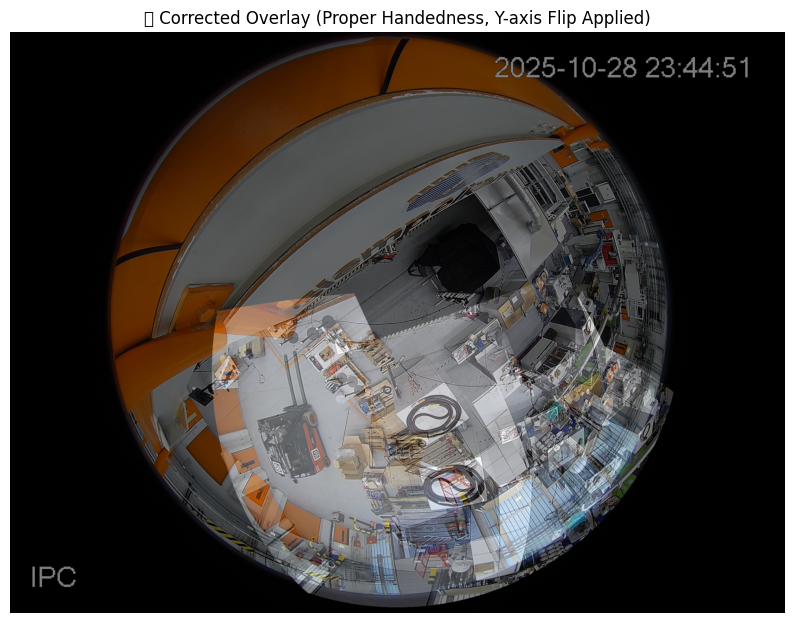

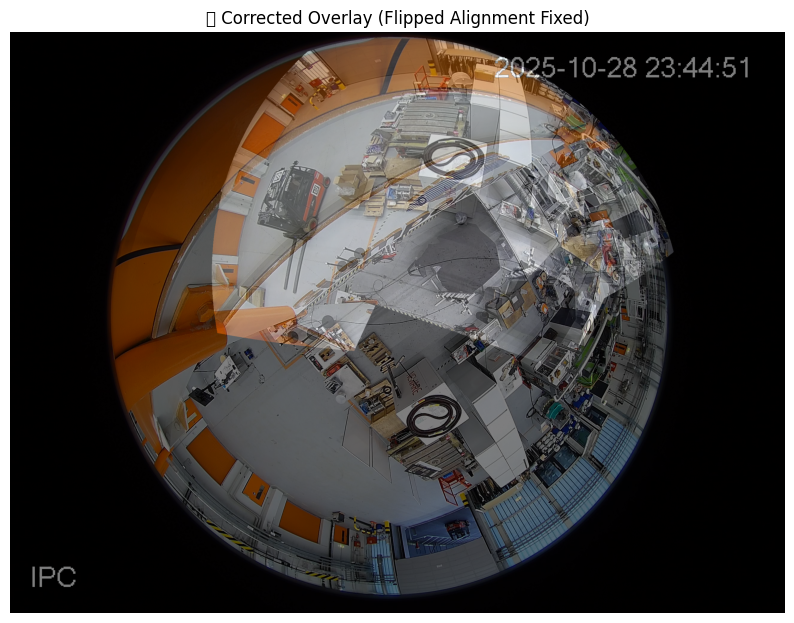

R_ref_est:
 [[-8.71168398e-01 -2.59286657e-01  4.16936508e-01]
 [ 4.90984283e-01 -4.60469258e-01  7.39528564e-01]
 [ 2.36555934e-04  8.48963187e-01  5.28451939e-01]]
Inliers: 60  /  317
Median angular error (deg): 1.9852931838130368
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...


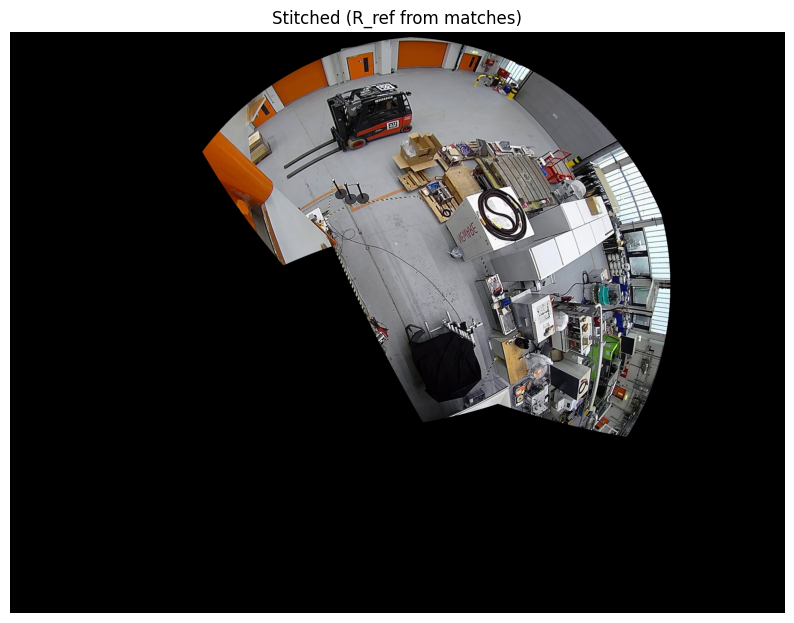

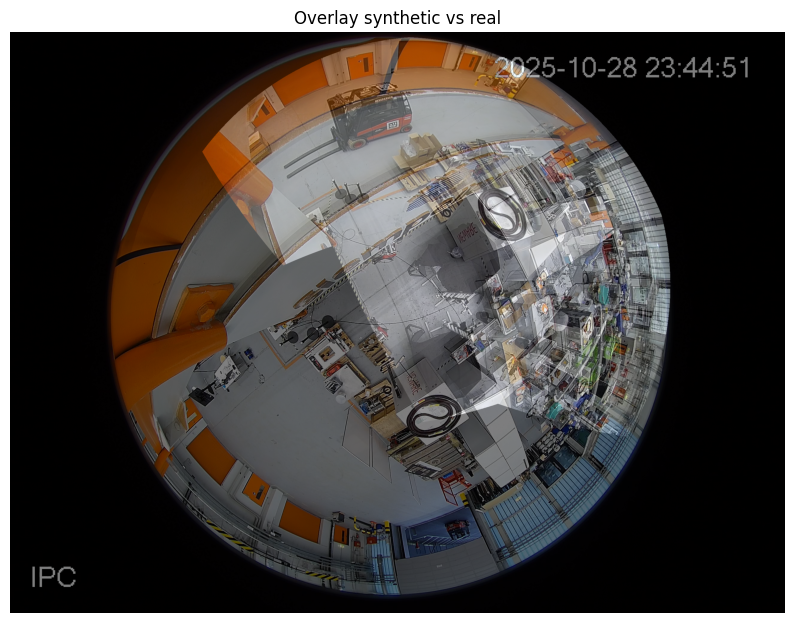

In [25]:
import numpy as np
import cv2
from scipy.spatial.transform import Rotation as R
from numpy.linalg import svd, norm
import random

# -----------------------------
# Helpers: pixel -> unit ray
# -----------------------------
def rect_px_to_ray(px, K):
    """px: Nx2, K: 3x3. returns Nx3 unit rays in camera coords."""
    px = np.asarray(px, dtype=np.float64).reshape(-1,2)
    fx, fy = K[0,0], K[1,1]
    cx, cy = K[0,2], K[1,2]
    x = (px[:,0] - cx) / fx
    y = (px[:,1] - cy) / fy
    v = np.stack([x, y, np.ones_like(x)], axis=-1)
    v /= np.linalg.norm(v, axis=1, keepdims=True)
    return v

def fisheye_px_to_ray(px, fisheye_params):
    """px: Nx2 pixel coords in fisheye image -> returns Nx3 rays in fisheye frame (unit)."""
    px = np.asarray(px, dtype=np.float64).reshape(-1,2)
    cx, cy = fisheye_params['cx'], fisheye_params['cy']
    radius, theta_max = fisheye_params['radius'], fisheye_params['theta_max_rad']
    dx = px[:,0] - cx
    dy = cy - px[:,1]
    r = np.sqrt(dx*dx + dy*dy)
    # clamp to radius
    r_clip = np.clip(r, 0, radius)
    theta = (r_clip / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    x = sin_t * np.cos(phi)
    y = sin_t * np.sin(phi)
    z = np.cos(theta)
    rays = np.stack([x,y,z], axis=-1)
    rays /= np.linalg.norm(rays, axis=1, keepdims=True)
    return rays

# -----------------------------
# Matching between fisheye and a rect view
# -----------------------------
def match_fisheye_rect(fisheye_gray, rect_gray):
    """Return matched point arrays (pts_fish, pts_rect) as Nx2. Uses ORB + ratio test."""
    # use ORB (SIFT if available). ORB robust & fast.
    orb = cv2.ORB_create(4000)
    kf, des_f = orb.detectAndCompute(fisheye_gray, None)
    kr, des_r = orb.detectAndCompute(rect_gray, None)
    if des_f is None or des_r is None or len(des_f)==0 or len(des_r)==0:
        return np.empty((0,2)), np.empty((0,2))

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    matches = bf.knnMatch(des_r, des_f, k=2)  # rect->fisheye
    good = []
    for m,n in matches:
        if m.distance < 0.75 * n.distance:
            good.append((m.queryIdx, m.trainIdx))
    pts_r = np.array([kr[m].pt for m,_ in good], dtype=np.float32) if good else np.empty((0,2),dtype=np.float32)
    pts_f = np.array([kf[n].pt for _,n in good], dtype=np.float32) if good else np.empty((0,2),dtype=np.float32)
    return pts_f, pts_r

# -----------------------------
# RANSAC + orthogonal Procrustes
# -----------------------------
def estimate_R_ref_ransac(matches_all, R_list, fisheye_params, K_rect, n_iter=500, inlier_thresh_deg=3.0):
    """
    matches_all: list of tuples (cam_idx, pts_f (Nx2), pts_r (Nx2)) for each rect view that had matches
    R_list: BA rotations camera->reference
    returns: best_R_ref (3x3), inliers_info
    """
    # Build large correspondence list of (a_i, b_i) pairs where:
    # a_i = ray_fisheye (in fish frame)
    # b_i = R_cam @ ray_rect (ray in reference frame)
    As = []
    Bs = []
    cam_idx_of_match = []

    for cam_idx, pts_f, pts_r in matches_all:
        if pts_f.shape[0]==0: continue
        rays_f = fisheye_px_to_ray(pts_f, fisheye_params)      # Nx3
        rays_r = rect_px_to_ray(pts_r, K_rect)                # Nx3 (camera coords)
        # map rect camera rays to reference frame: b = R_cam @ r_rect
        R_cam = R_list[cam_idx]
        rays_r_ref = (R_cam @ rays_r.T).T                      # Nx3
        As.append(rays_f)
        Bs.append(rays_r_ref)
        cam_idx_of_match += [cam_idx]*rays_f.shape[0]

    if not As:
        raise RuntimeError("No matches found")

    A = np.vstack(As)
    B = np.vstack(Bs)
    cam_idx_of_match = np.array(cam_idx_of_match, dtype=int)

    N = A.shape[0]
    best_inliers = []
    best_R = np.eye(3)
    thresh = np.deg2rad(inlier_thresh_deg)

    for it in range(n_iter):
        # sample 3 correspondences (non-collinear)
        idxs = np.random.choice(N, 3, replace=False)
        a_s = A[idxs]
        b_s = B[idxs]
        # estimate rotation using SVD (Orthogonal Procrustes)
        H = b_s.T @ a_s
        U,_,Vt = svd(H)
        R_est = Vt.T @ U.T
        if np.linalg.det(R_est) < 0:
            Vt[-1,:] *= -1
            R_est = Vt.T @ U.T
        # compute angular error for all matches
        b_rot = (R_est @ B.T).T   # R * B -> should align with A
        cosang = np.clip(np.sum(b_rot * A, axis=1), -1, 1)
        ang = np.arccos(cosang)
        inliers = np.where(ang < thresh)[0]
        if len(inliers) > len(best_inliers):
            best_inliers = inliers
            best_R = R_est
            # early exit if many inliers
            if len(best_inliers) > 0.6 * N:
                break

    # refine using all inliers via Procrustes
    if len(best_inliers) > 3:
        A_in = A[best_inliers]
        B_in = B[best_inliers]
        H = B_in.T @ A_in
        U,S,Vt = svd(H)
        R_ref = Vt.T @ U.T
        if np.linalg.det(R_ref) < 0:
            Vt[-1,:] *= -1
            R_ref = Vt.T @ U.T
    else:
        R_ref = best_R

    # compute final inlier list and errors
    b_rot = (R_ref @ B.T).T
    cosang = np.clip(np.sum(b_rot * A, axis=1), -1, 1)
    ang = np.degrees(np.arccos(cosang))
    inliers_final = np.where(ang < np.degrees(thresh))[0]

    return R_ref, dict(inliers=inliers_final, ang_errors=ang, total_matches=N)

# -----------------------------
# MAIN: match each view to fisheye and estimate R_ref
# -----------------------------
# convert fisheye to gray (uint8) & rects to gray
fisheye_gray = cv2.cvtColor((fisheye_img*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)

matches_all = []
for cam_idx, rect_img in enumerate(views):
    rect_gray = cv2.cvtColor((rect_img*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    pts_f, pts_r = match_fisheye_rect(fisheye_gray, rect_gray)
    print(f"View {cam_idx}: matches found = {len(pts_r)}")
    matches_all.append((cam_idx, pts_f, pts_r))

# Build K_rect (example)
K_rect = np.array([[1280.0, 0.0, 640.0],
                   [0.0, 1280.0, 360.0],
                   [0.0, 0.0, 1.0]], dtype=np.float64)

R_ref_est, info = estimate_R_ref_ransac(matches_all, R_list, fisheye_params, K_rect, n_iter=800, inlier_thresh_deg=4.0)
# ----------------------------------------------------------------------
# Flip / transpose test to correct mirrored alignment
# ----------------------------------------------------------------------
def test_alignment(R_ref_est, R_list, fisheye_img, views, fisheye_params):
    def evaluate_R(R_test):
        stitched = stitch_textures_reference([R_test @ R_i for R_i in R_list], views, fisheye_params)
        gray_stitched = cv2.cvtColor((np.clip(stitched, 0, 1) * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        gray_fish = cv2.cvtColor((np.clip(fisheye_img, 0, 1) * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        gray_fish = cv2.resize(gray_fish, (gray_stitched.shape[1], gray_stitched.shape[0]))
        # use normalized cross-correlation as score
        score = cv2.matchTemplate(gray_stitched, gray_fish, cv2.TM_CCOEFF_NORMED)
        return score[0][0], stitched

    candidates = {
        "R": R_ref_est,
        "R_T": R_ref_est.T,
        "R_flipX": R_ref_est @ np.diag([-1, 1, 1]),
        "R_flipY": R_ref_est @ np.diag([1, -1, 1]),
        "R_flipZ": R_ref_est @ np.diag([1, 1, -1]),
    }

    best_score = -1
    best_R = None
    best_stitch = None

    for name, R_test in candidates.items():
        score, stitched = evaluate_R(R_test)
        print(f"{name}: NCC score = {score:.4f}")
        if score > best_score:
            best_score = score
            best_R = R_test
            best_stitch = stitched

    print("\n✅ Best alignment variant:", [k for k,v in candidates.items() if np.allclose(v, best_R)][0])
    return best_R, best_stitch

# ----------------------------------------------------------------------
# Run correction test
# ----------------------------------------------------------------------
R_ref_fixed, stitched_fixed = test_alignment(R_ref_est, R_list, fisheye_img, views, fisheye_params)
R_flipY = np.diag([1, -1, 1])
R_ref_corrected = R_flipY @ R_ref_fixed 
R_list_global = [R_ref_corrected @ R_i for R_i in R_list]
stitched_corrected = stitch_textures_reference(R_list_global, views, fisheye_params)
overlay = 0.5 * stitched_corrected + 0.5 * fisheye_img
plt.figure(figsize=(10,10))
plt.imshow(np.clip(overlay, 0, 1))
plt.title("✅ Corrected Overlay (Proper Handedness, Y-axis Flip Applied)")
plt.axis("off")
plt.show()
# ----------------------------------------------------------------------
# Visualize final corrected alignment
# ----------------------------------------------------------------------
overlay = 0.5 * stitched_fixed + 0.5 * fisheye_img
plt.figure(figsize=(10,10))
plt.imshow(np.clip(overlay, 0, 1))
plt.title("✅ Corrected Overlay (Flipped Alignment Fixed)")
plt.axis("off")
plt.show()

print("R_ref_est:\n", R_ref_est)
print("Inliers:", len(info['inliers']), " / ", info['total_matches'])
print("Median angular error (deg):", np.median(info['ang_errors'][info['inliers']]))

# -----------------------------
# Use R_ref_est to stitch textures (use R_list_global = R_ref_est @ R_list[i])
# -----------------------------
R_list_global = [R_ref_est @ R_i for R_i in R_list]
stitched = stitch_textures_reference(R_list_global, views, fisheye_params)  # reuse your stitch function
plt.figure(figsize=(10,10)); plt.imshow(np.clip(stitched,0,1)); plt.axis('off'); plt.title("Stitched (R_ref from matches)"); plt.show()

# Overlay to inspect
overlay = 0.5 * stitched + 0.5 * fisheye_img
plt.figure(figsize=(10,10)); plt.imshow(np.clip(overlay,0,1)); plt.axis('off'); plt.title("Overlay synthetic vs real"); plt.show()


[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...
R: NCC score = 0.3381
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...
R_T: NCC score = 0.3617
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...
R_flipX: NCC score = 0.3501
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...
R_flipY: NCC score = 0.2211
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...
R_flipZ: NCC score = 0.1324

✅ Best alignment variant: R_T
[Warping] View 0 ...
[Warping] View 1 ...
[Warping] View 2 ...
[Warping] View 3 ...


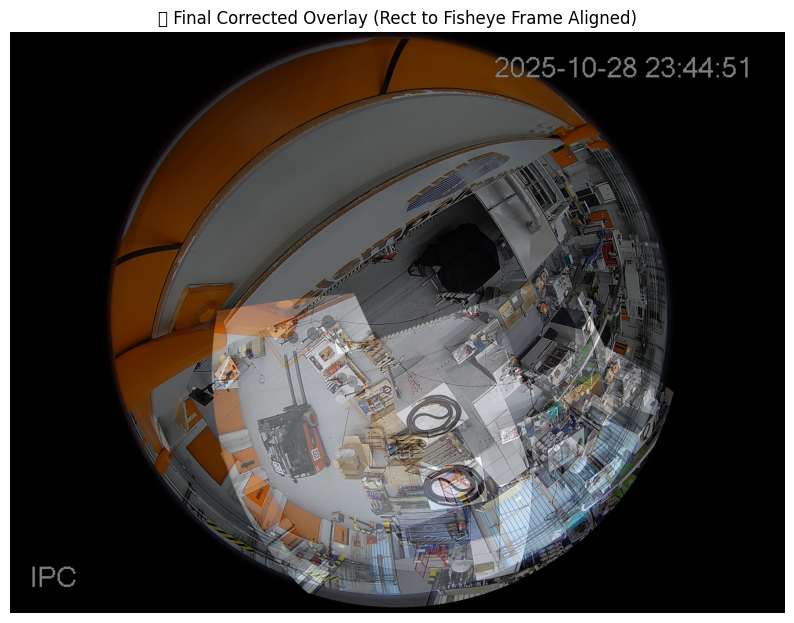

R_ref_est:
 [[-8.71168398e-01 -2.59286657e-01  4.16936508e-01]
 [ 4.90984283e-01 -4.60469258e-01  7.39528564e-01]
 [ 2.36555934e-04  8.48963187e-01  5.28451939e-01]]
Inliers: 60  /  317
Median angular error (deg): 1.9852931838130368


In [26]:
# ----------------------------------------------------------------------
# 1️⃣ Run alignment test and pick best variant
# ----------------------------------------------------------------------
R_ref_fixed, _ = test_alignment(R_ref_est, R_list, fisheye_img, views, fisheye_params)

# ----------------------------------------------------------------------
# 2️⃣ Apply Y-axis flip (to fix coordinate convention mismatch)
# ----------------------------------------------------------------------
R_flipY = np.diag([1, -1, 1])
R_ref_corrected = R_flipY @ R_ref_fixed  # correct handedness

# ----------------------------------------------------------------------
# 3️⃣ Compute final global rotations (in fisheye global frame)
# ----------------------------------------------------------------------
R_list_global = [R_ref_corrected @ R_i for R_i in R_list]

# ----------------------------------------------------------------------
# 4️⃣ Stitch textures using corrected rotations
# ----------------------------------------------------------------------
stitched_corrected = stitch_textures_reference(R_list_global, views, fisheye_params)

# ----------------------------------------------------------------------
# 5️⃣ Final overlay visualization
# ----------------------------------------------------------------------
overlay = 0.5 * stitched_corrected + 0.5 * fisheye_img
plt.figure(figsize=(10,10))
plt.imshow(np.clip(overlay, 0, 1))
plt.title("✅ Final Corrected Overlay (Rect to Fisheye Frame Aligned)")
plt.axis("off")
plt.show()

# ----------------------------------------------------------------------
# 6️⃣ Print final diagnostic info
# ----------------------------------------------------------------------
print("R_ref_est:\n", R_ref_est)
print("Inliers:", len(info['inliers']), " / ", info['total_matches'])
print("Median angular error (deg):", np.median(info['ang_errors'][info['inliers']]))


In [ ]:
fisheye_img = cv2.imread("20251028_164444 (1).png") 

c:\Users\Nahush\anaconda3\envs\test_env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


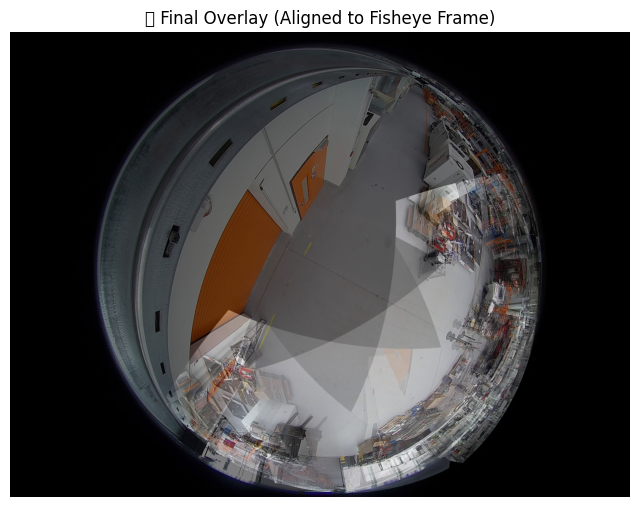

In [62]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# =====================================================
# FISHEYE PARAMETERS
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708  # 90° fisheye half-FOV
}

# =====================================================
# LOAD IMAGES
# =====================================================
crop_paths = [
    "captures_yaw_pitch/capture1/view1_1.jpg",
    "captures_yaw_pitch/capture1/view2_1.jpg",
    "captures_yaw_pitch/capture1/view4_1.jpg"
]

fisheye_img = cv2.imread("captures_yaw_pitch/capture1/fisheye_1.jpg") 
fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB) / 255.0
views = [cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB) / 255.0 for p in crop_paths]

# =====================================================
# BA-OPTIMIZED ROTATIONS (camera → reference)
# =====================================================
R_list = R_list

# =====================================================
# STITCH FUNCTION
# =====================================================
def stitch_textures_reference(R_list_global, views, fish):
    Hf, Wf = fish["height"], fish["width"]
    cx, cy, radius, theta_max = fish["cx"], fish["cy"], fish["radius"], fish["theta_max_rad"]
    canvas = np.zeros((Hf, Wf, 3), np.float32)
    count = np.zeros((Hf, Wf, 1), np.float32)

    # Generate fisheye rays (unit sphere coordinates)
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx, cy - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    ray_global = np.stack([
        np.sin(theta) * np.cos(phi),
        np.sin(theta) * np.sin(phi),
        np.cos(theta)
    ], axis=-1)

    Hr, Wr = 720, 1280  # rectilinear view size
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(90 / 2))  # FOV ~90°

    for view, R_cam in zip(views, R_list_global):
        # ✅ Correct transformation: global → local (camera frame)
        ray_local = ray_global @ R_cam  # camera→reference, so global→local uses R_cam

        X, Y, Z = ray_local[..., 0], ray_local[..., 1], ray_local[..., 2]
        u = f * (X / (Z + 1e-6)) + cx_r
        v = f * (Y / (Z + 1e-6)) + cy_r
        valid = (u >= 0) & (u < Wr) & (v >= 0) & (Z > 0)

        remap = cv2.remap(view, u.astype(np.float32), v.astype(np.float32),
                          cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
        canvas[valid] += remap[valid]
        count[valid] += 1

    count[count == 0] = 1
    return canvas / count

# =====================================================
# Y-AXIS FLIP (fix handedness)
# =====================================================
R_flipY = np.diag([1, -1, 1])

# Apply flip to all rotations (camera→reference)
R_list_global = [R_flipY @ R_i for R_i in R_list]

# =====================================================
# OPTIONAL GLOBAL ROTATION (if still tilted)
# =====================================================
# Try uncommenting one of these if needed:
# R_yaw90 = R.from_euler('z', 90, degrees=True).as_matrix()
# R_pitch90 = R.from_euler('x', 90, degrees=True).as_matrix()
# R_roll180 = R.from_euler('z', 180, degrees=True).as_matrix()
# R_list_global = [R_yaw90 @ R_i for R_i in R_list_global]

# =====================================================
# STITCH AND OVERLAY
# =====================================================
stitched_corrected = stitch_textures_reference(R_list_global, views, fisheye_params)
# Step 1: apply handedness and fisheye-to-ref rotation
R_ref_corrected = R_flipY @ R_ref_est

# Step 2: convert each camera rotation into fisheye frame
R_list_global = [R_ref_corrected @ R_i for R_i in R_list]

# Step 3: stitch using the *global* rotations
stitched_corrected = stitch_textures_reference(R_list_global, views, fisheye_params)

# Step 4: overlay with real fisheye
overlay = 0.5 * stitched_corrected + 0.5 * fisheye_img
plt.figure(figsize=(8, 8))
plt.imshow(np.clip(overlay, 0, 1))
plt.title("✅ Final Overlay (Aligned to Fisheye Frame)")
plt.axis("off")
plt.show()


In [61]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R
from numpy.linalg import svd

# ============================================================
# USER INPUTS
# ============================================================
crop_paths = [
    "ohlf_fisheye/cam_233_view1.jpg",
    "ohlf_fisheye/cam_233_view2.jpg",
    "ohlf_fisheye/cam_233_view3.jpg",
    "ohlf_fisheye/cam_233_view4.jpg"
]
fisheye_path = "fisheye_capture.png"

fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# BA-optimized camera rotations (camera → reference)
R_list = R_list

# ============================================================
# IMAGE LOADING
# ============================================================
fisheye_img = cv2.imread(fisheye_path)
fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

views = []
for p in crop_paths:
    im = cv2.imread(p)
    views.append(cv2.cvtColor(im, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0)

# ============================================================
# BASIC FUNCTIONS
# ============================================================
def rect_px_to_ray(px, K):
    px = np.asarray(px, np.float64).reshape(-1,2)
    fx, fy = K[0,0], K[1,1]
    cx, cy = K[0,2], K[1,2]
    x = (px[:,0] - cx) / fx
    y = (px[:,1] - cy) / fy
    v = np.stack([x, y, np.ones_like(x)], axis=-1)
    v /= np.linalg.norm(v, axis=1, keepdims=True)
    return v

def fisheye_px_to_ray(px, fish):
    px = np.asarray(px, np.float64).reshape(-1,2)
    cx, cy = fish['cx'], fish['cy']
    radius, theta_max = fish['radius'], fish['theta_max_rad']
    dx, dy = px[:,0] - cx, cy - px[:,1]
    r = np.sqrt(dx*dx + dy*dy)
    theta = (np.clip(r, 0, radius) / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    x = sin_t * np.cos(phi)
    y = sin_t * np.sin(phi)
    z = np.cos(theta)
    rays = np.stack([x,y,z], axis=-1)
    rays /= np.linalg.norm(rays, axis=1, keepdims=True)
    return rays

# ============================================================
# MATCH FISHEYE ↔ RECTILINEAR USING ORB
# ============================================================
def match_fisheye_rect(fisheye_gray, rect_gray):
    orb = cv2.ORB_create(4000)
    kf, des_f = orb.detectAndCompute(fisheye_gray, None)
    kr, des_r = orb.detectAndCompute(rect_gray, None)
    if des_f is None or des_r is None:
        return np.empty((0,2)), np.empty((0,2))
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = bf.knnMatch(des_r, des_f, k=2)
    good = [(m.queryIdx, m.trainIdx) for m,n in matches if m.distance < 0.75*n.distance]
    pts_r = np.array([kr[m].pt for m,_ in good], np.float32)
    pts_f = np.array([kf[n].pt for _,n in good], np.float32)
    return pts_f, pts_r

# ============================================================
# RANSAC + PROCRUSTES ESTIMATION
# ============================================================
def estimate_R_ref_ransac(matches_all, R_list, fish, K_rect, n_iter=1000, inlier_thresh_deg=4.0):
    A_list, B_list = [], []
    for cam_idx, pts_f, pts_r in matches_all:
        if pts_f.shape[0] == 0:
            continue
        rays_f = fisheye_px_to_ray(pts_f, fish)
        rays_r = rect_px_to_ray(pts_r, K_rect)
        rays_ref = (R_list[cam_idx] @ rays_r.T).T
        A_list.append(rays_f)
        B_list.append(rays_ref)
    if not A_list:
        raise RuntimeError("No matches found.")
    A = np.vstack(A_list)
    B = np.vstack(B_list)

    N = A.shape[0]
    best_inliers, best_R = [], np.eye(3)
    thresh = np.deg2rad(inlier_thresh_deg)

    for _ in range(n_iter):
        idx = np.random.choice(N, 3, replace=False)
        H = B[idx].T @ A[idx]
        U,_,Vt = svd(H)
        R_est = Vt.T @ U.T
        if np.linalg.det(R_est) < 0:
            Vt[-1,:] *= -1
            R_est = Vt.T @ U.T
        ang = np.arccos(np.clip(np.sum((R_est @ B.T).T * A, axis=1), -1, 1))
        inliers = np.where(ang < thresh)[0]
        if len(inliers) > len(best_inliers):
            best_inliers, best_R = inliers, R_est
            if len(inliers) > 0.6 * N:
                break

    if len(best_inliers) > 3:
        A_in, B_in = A[best_inliers], B[best_inliers]
        H = B_in.T @ A_in
        U,_,Vt = svd(H)
        R_ref = Vt.T @ U.T
        if np.linalg.det(R_ref) < 0:
            Vt[-1,:] *= -1
            R_ref = Vt.T @ U.T
    else:
        R_ref = best_R

    return R_ref

# ============================================================
# STITCH FUNCTION  (✅ FIXED R_cam.T)
# ============================================================
def stitch_textures_reference(R_list_global, views, fish, rect_size=(1280,720)):
    Hf, Wf = fish["height"], fish["width"]
    cx, cy, radius, theta_max = fish["cx"], fish["cy"], fish["radius"], fish["theta_max_rad"]

    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx, cy - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    ray_global = np.stack([sin_t*np.cos(phi), sin_t*np.sin(phi), np.cos(theta)], axis=-1)

    Wr, Hr = rect_size
    f = (Wr/2.0)/np.tan(np.deg2rad(90/2))
    cx_r, cy_r = Wr/2.0, Hr/2.0

    canvas = np.zeros((Hf, Wf, 3), np.float32)
    weight = np.zeros((Hf, Wf, 1), np.float32)

    for view, R_cam in zip(views, R_list_global):
        # ✅ Use transpose fix
        ray_local = ray_global @ R_cam.T  
        X, Y, Z = ray_local[...,0], ray_local[...,1], ray_local[...,2]
        u = f * (X / (Z+1e-9)) + cx_r
        v = f * (Y / (Z+1e-9)) + cy_r
        valid = (Z > 0) & (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr)

        if not np.any(valid):
            continue

        map_x, map_y = u.astype(np.float32), v.astype(np.float32)
        remap = cv2.remap((view*255).astype(np.uint8), map_x, map_y, cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
        remap = remap.astype(np.float32) / 255.0
        mask = valid[...,None]
        canvas[mask[:,:,0]] += remap[mask[:,:,0]]
        weight[mask[:,:,0]] += 1.0

    weight[weight==0] = 1.0
    return canvas / weight

# ============================================================
# MAIN EXECUTION
# ============================================================
fisheye_gray = cv2.cvtColor((fisheye_img*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
matches_all = []
for cam_idx, rect_img in enumerate(views):
    rect_gray = cv2.cvtColor((rect_img*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    pts_f, pts_r = match_fisheye_rect(fisheye_gray, rect_gray)
    print(f"View {cam_idx}: matches = {len(pts_f)}")
    matches_all.append((cam_idx, pts_f, pts_r))

K_rect = np.array([[1280,0,640],[0,1280,360],[0,0,1]], np.float64)
R_ref_est = estimate_R_ref_ransac(matches_all, R_list, fisheye_params, K_rect)

# Apply Y-flip (handedness correction)
R_flipY = np.diag([1,-1,1])
R_ref_corrected = R_flipY @ R_ref_est

R_list_global = [R_ref_corrected @ R_i for R_i in R_list]

stitched_final = stitch_textures_reference(R_list_global, views, fisheye_params)
overlay = 0.5*stitched_final + 0.5*fisheye_img

plt.figure(figsize=(8,8))
plt.imshow(np.clip(overlay,0,1))
plt.title("✅ Final Overlay (Aligned with Fisheye Frame, R_cam.T Fix Applied)")
plt.axis('off')
plt.show()


error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


View 0: matches = 121
View 1: matches = 27
View 2: matches = 59
View 3: matches = 110


c:\Users\Nahush\anaconda3\envs\test_env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


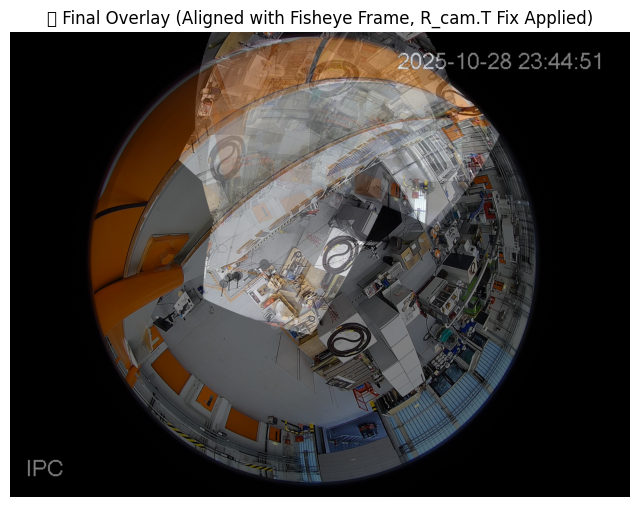

In [41]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R
from numpy.linalg import svd

# ============================================================
# USER INPUTS
# ============================================================
crop_paths = [
    "ohlf_fisheye/cam_233_view1.jpg",
    "ohlf_fisheye/cam_233_view2.jpg",
    "ohlf_fisheye/cam_233_view3.jpg",
    "ohlf_fisheye/cam_233_view4.jpg"
]


fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# BA-optimized camera rotations (camera → reference)
R_list = [
    np.array([[ 0.66873112,  0.49788867, -0.55218254],
              [-0.55245517,  0.82977828,  0.07912826],
              [ 0.49758614,  0.25214057,  0.82995973]]),
    np.array([[ 0.77668757, -0.43774794,  0.45291628],
              [ 0.46880015,  0.88197133,  0.0485076 ],
              [-0.42069328,  0.17465197,  0.89023247]]),
    np.eye(3),
    np.array([[ 0.80913032,  0.58193753, -0.08158943],
              [-0.43651703,  0.68818788,  0.57952595],
              [ 0.39339675, -0.43329684,  0.81085932]])
]

# ============================================================
# IMAGE LOADING
# ============================================================
fisheye_img = cv2.imread("20251028_164444 (1).png") 
fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

views = []
for p in crop_paths:
    im = cv2.imread(p)
    views.append(cv2.cvtColor(im, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0)

# ============================================================
# BASIC FUNCTIONS
# ============================================================
def rect_px_to_ray(px, K):
    px = np.asarray(px, np.float64).reshape(-1,2)
    fx, fy = K[0,0], K[1,1]
    cx, cy = K[0,2], K[1,2]
    x = (px[:,0] - cx) / fx
    y = (px[:,1] - cy) / fy
    v = np.stack([x, y, np.ones_like(x)], axis=-1)
    v /= np.linalg.norm(v, axis=1, keepdims=True)
    return v

def fisheye_px_to_ray(px, fish):
    px = np.asarray(px, np.float64).reshape(-1,2)
    cx, cy = fish['cx'], fish['cy']
    radius, theta_max = fish['radius'], fish['theta_max_rad']
    dx, dy = px[:,0] - cx, cy - px[:,1]
    r = np.sqrt(dx*dx + dy*dy)
    theta = (np.clip(r, 0, radius) / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    x = sin_t * np.cos(phi)
    y = sin_t * np.sin(phi)
    z = np.cos(theta)
    rays = np.stack([x,y,z], axis=-1)
    rays /= np.linalg.norm(rays, axis=1, keepdims=True)
    return rays

# ============================================================
# MATCH FISHEYE ↔ RECTILINEAR USING ORB
# ============================================================
def match_fisheye_rect(fisheye_gray, rect_gray):
    orb = cv2.ORB_create(4000)
    kf, des_f = orb.detectAndCompute(fisheye_gray, None)
    kr, des_r = orb.detectAndCompute(rect_gray, None)
    if des_f is None or des_r is None:
        return np.empty((0,2)), np.empty((0,2))
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = bf.knnMatch(des_r, des_f, k=2)
    good = [(m.queryIdx, m.trainIdx) for m,n in matches if m.distance < 0.75*n.distance]
    pts_r = np.array([kr[m].pt for m,_ in good], np.float32)
    pts_f = np.array([kf[n].pt for _,n in good], np.float32)
    return pts_f, pts_r

# ============================================================
# RANSAC + PROCRUSTES ESTIMATION
# ============================================================
def estimate_R_ref_ransac(matches_all, R_list, fish, K_rect, n_iter=1000, inlier_thresh_deg=4.0):
    A_list, B_list = [], []
    for cam_idx, pts_f, pts_r in matches_all:
        if pts_f.shape[0] == 0:
            continue
        rays_f = fisheye_px_to_ray(pts_f, fish)
        rays_r = rect_px_to_ray(pts_r, K_rect)
        rays_ref = (R_list[cam_idx] @ rays_r.T).T
        A_list.append(rays_f)
        B_list.append(rays_ref)
    if not A_list:
        raise RuntimeError("No matches found.")
    A = np.vstack(A_list)
    B = np.vstack(B_list)

    N = A.shape[0]
    best_inliers, best_R = [], np.eye(3)
    thresh = np.deg2rad(inlier_thresh_deg)

    for _ in range(n_iter):
        idx = np.random.choice(N, 3, replace=False)
        H = B[idx].T @ A[idx]
        U,_,Vt = svd(H)
        R_est = Vt.T @ U.T
        if np.linalg.det(R_est) < 0:
            Vt[-1,:] *= -1
            R_est = Vt.T @ U.T
        ang = np.arccos(np.clip(np.sum((R_est @ B.T).T * A, axis=1), -1, 1))
        inliers = np.where(ang < thresh)[0]
        if len(inliers) > len(best_inliers):
            best_inliers, best_R = inliers, R_est
            if len(inliers) > 0.6 * N:
                break

    if len(best_inliers) > 3:
        A_in, B_in = A[best_inliers], B[best_inliers]
        H = B_in.T @ A_in
        U,_,Vt = svd(H)
        R_ref = Vt.T @ U.T
        if np.linalg.det(R_ref) < 0:
            Vt[-1,:] *= -1
            R_ref = Vt.T @ U.T
    else:
        R_ref = best_R

    return R_ref

# ============================================================
# STITCH FUNCTION  (✅ FIXED R_cam.T)
# ============================================================
def stitch_textures_reference(R_list_global, views, fish, rect_size=(1280,720)):
    Hf, Wf = fish["height"], fish["width"]
    cx, cy, radius, theta_max = fish["cx"], fish["cy"], fish["radius"], fish["theta_max_rad"]

    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx, cy - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    ray_global = np.stack([sin_t*np.cos(phi), sin_t*np.sin(phi), np.cos(theta)], axis=-1)

    Wr, Hr = rect_size
    f = (Wr/2.0)/np.tan(np.deg2rad(90/2))
    cx_r, cy_r = Wr/2.0, Hr/2.0

    canvas = np.zeros((Hf, Wf, 3), np.float32)
    weight = np.zeros((Hf, Wf, 1), np.float32)

    for view, R_cam in zip(views, R_list_global):
        # ✅ Use transpose fix
        ray_local = ray_global @ R_cam.T  
        X, Y, Z = ray_local[...,0], ray_local[...,1], ray_local[...,2]
        u = f * (X / (Z+1e-9)) + cx_r
        v = f * (Y / (Z+1e-9)) + cy_r
        valid = (Z > 0) & (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr)

        if not np.any(valid):
            continue

        map_x, map_y = u.astype(np.float32), v.astype(np.float32)
        remap = cv2.remap((view*255).astype(np.uint8), map_x, map_y, cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
        remap = remap.astype(np.float32) / 255.0
        mask = valid[...,None]
        canvas[mask[:,:,0]] += remap[mask[:,:,0]]
        weight[mask[:,:,0]] += 1.0

    weight[weight==0] = 1.0
    return canvas / weight

# ============================================================
# MAIN EXECUTION
# ============================================================
fisheye_gray = cv2.cvtColor((fisheye_img*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
matches_all = []
for cam_idx, rect_img in enumerate(views):
    rect_gray = cv2.cvtColor((rect_img*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    pts_f, pts_r = match_fisheye_rect(fisheye_gray, rect_gray)
    print(f"View {cam_idx}: matches = {len(pts_f)}")
    matches_all.append((cam_idx, pts_f, pts_r))

K_rect = np.array([[1280,0,640],[0,1280,360],[0,0,1]], np.float64)
R_ref_est = estimate_R_ref_ransac(matches_all, R_list, fisheye_params, K_rect)

# Apply Y-flip (handedness correction)
R_flipY = np.diag([1,-1,1])
R_ref_corrected = R_flipY @ R_ref_est

R_list_global = [R_ref_corrected @ R_i for R_i in R_list]

stitched_final = stitch_textures_reference(R_list_global, views, fisheye_params)
overlay = 0.5*stitched_final + 0.5*fisheye_img

plt.figure(figsize=(8,8))
plt.imshow(np.clip(overlay,0,1))
plt.title("✅ Final Overlay (Aligned with Fisheye Frame, R_cam.T Fix Applied)")
plt.axis('off')
plt.show()


In [34]:
# 1. apply R_ref_est (from matching) and fix handedness
R_ref_corrected = R_flipY @ R_ref_est

# 2. global rotations in fisheye frame
R_list_global = [R_ref_corrected @ R_i for R_i in R_list]

# 3. (optional) small yaw align:
# R_yaw90 = R.from_euler('z', 90, degrees=True).as_matrix()
# R_list_global = [R_yaw90 @ R for R in R_list_global]

# 4. stitch using R_list_global (call your stitch function)
stitched = stitch_textures_reference(R_list_global, views, fisheye_params)


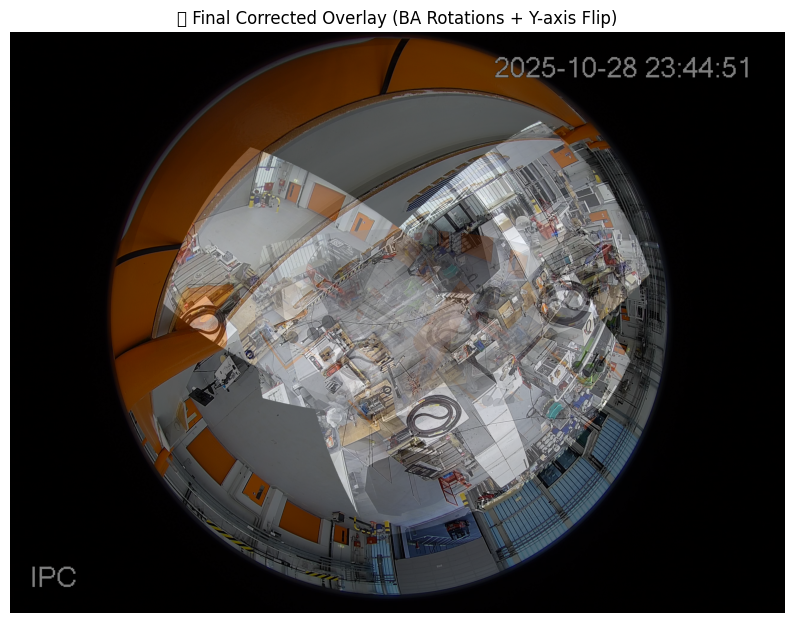

In [30]:

import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R

# =====================================================
# FISHEYE PARAMETERS
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# =====================================================
# LOAD IMAGES
# =====================================================
crop_paths = [
    "ohlf_fisheye/cam_233_view1.jpg",
    "ohlf_fisheye/cam_233_view2.jpg",
    "ohlf_fisheye/cam_233_view3.jpg",
    "ohlf_fisheye/cam_233_view4.jpg"
]
fisheye_img = cv2.imread("20251028_164444 (1).png") 
fisheye_img = cv2.cvtColor(fisheye_img, cv2.COLOR_BGR2RGB) / 255.0
views = [cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB) / 255.0 for p in crop_paths]

# =====================================================
# BA ROTATIONS (from your summary)
# =====================================================
R_list = [
    np.array([[ 0.66873112,  0.49788867, -0.55218254],
              [-0.55245517,  0.82977828,  0.07912826],
              [ 0.49758614,  0.25214057,  0.82995973]]),

    np.array([[ 0.77668757, -0.43774794,  0.45291628],
              [ 0.46880015,  0.88197133,  0.0485076 ],
              [-0.42069328,  0.17465197,  0.89023247]]),

    np.eye(3),

    np.array([[ 0.80913032,  0.58193753, -0.08158943],
              [-0.43651703,  0.68818788,  0.57952595],
              [ 0.39339675, -0.43329684,  0.81085932]])
]

# =====================================================
# STITCHING FUNCTION
# =====================================================
def stitch_textures_reference(R_list_global, views, fish):
    Hf, Wf = fish["height"], fish["width"]
    cx, cy, radius, theta_max = fish["cx"], fish["cy"], fish["radius"], fish["theta_max_rad"]
    canvas = np.zeros((Hf, Wf, 3), np.float32)
    count = np.zeros((Hf, Wf, 1), np.float32)

    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx, cy - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    ray_fish = np.stack([
        np.sin(theta) * np.cos(phi),
        np.sin(theta) * np.sin(phi),
        np.cos(theta)
    ], axis=-1)

    Hr, Wr = 720, 1280
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(90 / 2))

    for view, Rg in zip(views, R_list_global):
        ray_cam = ray_fish @ Rg.T
        X, Y, Z = ray_cam[..., 0], ray_cam[..., 1], ray_cam[..., 2]
        u = f * (X / (Z + 1e-6)) + cx_r
        v = f * (Y / (Z + 1e-6)) + cy_r
        valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (Z > 0)

        remap = cv2.remap(view, u.astype(np.float32), v.astype(np.float32),
                          cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
        canvas[valid] += remap[valid]
        count[valid] += 1

    count[count == 0] = 1
    return canvas / count

# =====================================================
# MIRROR FIX (Y-axis flip)
# =====================================================
R_flipY = np.diag([1, -1, 1])

# =====================================================
# OPTION 1: BA-based orientations relative to reference
# =====================================================
# Each rect view is rotated relative to the reference (R_ref = I)
# Then we move to fisheye convention (Y flipped)
R_list_global = [R_flipY @ R_i for R_i in R_list]

# =====================================================
# OPTION 2: Add optional 90° yaw rotation if needed
# =====================================================
# (use this if your overlay is still rotated incorrectly)
# R_yaw90 = R.from_euler('z', 90, degrees=True).as_matrix()
# R_list_global = [R_yaw90 @ (R_flipY @ R_i) for R_i in R_list]

# =====================================================
# STITCH
# =====================================================
stitched_corrected = stitch_textures_reference(R_list_global, views, fisheye_params)

# =====================================================
# OVERLAY
# =====================================================
overlay = 0.5 * stitched_corrected + 0.5 * fisheye_img
plt.figure(figsize=(10, 10))
plt.imshow(np.clip(overlay, 0, 1))
plt.title("✅ Final Corrected Overlay (BA Rotations + Y-axis Flip)")
plt.axis("off")
plt.show()


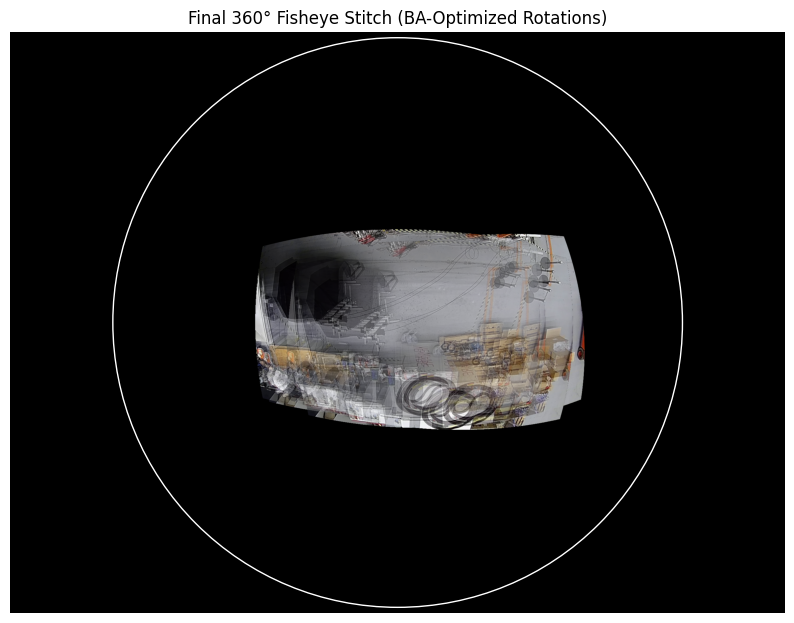

In [11]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ============================================================
# 1️⃣  LOAD BA ROTATION MATRICES
# ============================================================
# R_list must already be defined from the BA output, e.g.:
# R_list = [R0, R1, R2, R3]  (4 cameras)
# Each R_i is a 3x3 rotation matrix.

if "R_list" not in locals():
    raise RuntimeError("❌ R_list (rotation matrices from BA) not found! Run BA first.")

# ============================================================
# 2️⃣  DEFINE FISHEYE GEOMETRY (same as your project code)
# ============================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

# ============================================================
# 3️⃣  RECTILINEAR IMAGE PARAMETERS
# ============================================================
Wr, Hr = 1280, 720
cx_r, cy_r = Wr / 2, Hr / 2
fov = 90.0
f = (Wr / 2) / np.tan(np.deg2rad(fov / 2))

# Load rectilinear views (already pre-aligned from ALIKED crops)
views = [
    cv2.imread("ohlf_fisheye/cam_233_view4.jpg"),
    cv2.imread("ohlf_fisheye/cam_233_view4.jpg"),
    cv2.imread("ohlf_fisheye/cam_233_view4.jpg"),
    cv2.imread("ohlf_fisheye/cam_233_view4.jpg"),
]
views = [cv2.cvtColor(v, cv2.COLOR_BGR2RGB) / 255.0 for v in views]

# ============================================================
# 4️⃣  STITCH USING OPTIMIZED ROTATIONS
# ============================================================
fisheye_canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
weight_mask = np.zeros((Hf, Wf, 1), dtype=np.float32)

# Precompute fisheye pixel grid
xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
dx, dy = xs - cx_f, cy_f - ys
r = np.sqrt(dx**2 + dy**2)
theta = (r / radius) * theta_max
phi = np.arctan2(dy, dx)
sin_t = np.sin(theta)
ray_global = np.dstack((sin_t * np.cos(phi),
                        sin_t * np.sin(phi),
                        np.cos(theta)))

for i, R_i in enumerate(R_list):
    if i >= len(views): break
    rect_img = cv2.resize(views[i], (Wr, Hr))

    # Rotate global ray directions into rect-camera coordinates
    ray_local = ray_global @ R_i  # (Hf,Wf,3)
    Xc, Yc, Zc = ray_local[..., 0], ray_local[..., 1], ray_local[..., 2]

    # Perspective projection onto rectilinear image
    u = f * (Xc / (Zc + 1e-6)) + cx_r
    v = f * (Yc / (Zc + 1e-6)) + cy_r

    valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (Zc > 0)
    warped = cv2.remap(rect_img, u.astype(np.float32), v.astype(np.float32),
                       interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)

    mask = np.zeros((Hf, Wf, 1), dtype=np.float32)
    mask[valid] = 1.0

    fisheye_canvas += warped * mask
    weight_mask += mask

# Avoid division by zero
weight_mask[weight_mask == 0] = 1
fisheye_stitched = fisheye_canvas / weight_mask

# Mask outside fisheye circle
circle_mask = ((xs - cx_f)**2 + (ys - cy_f)**2) <= radius**2
fisheye_stitched[~circle_mask] = 0

# ============================================================
# 5️⃣  VISUALIZE RESULT
# ============================================================
plt.figure(figsize=(10, 10))
plt.imshow(fisheye_stitched)
circ = plt.Circle((cx_f, cy_f), radius, color=(1,1,1), fill=False, linewidth=1)
plt.gca().add_patch(circ)
plt.title("Final 360° Fisheye Stitch (BA-Optimized Rotations)")
plt.axis("off")
plt.show()


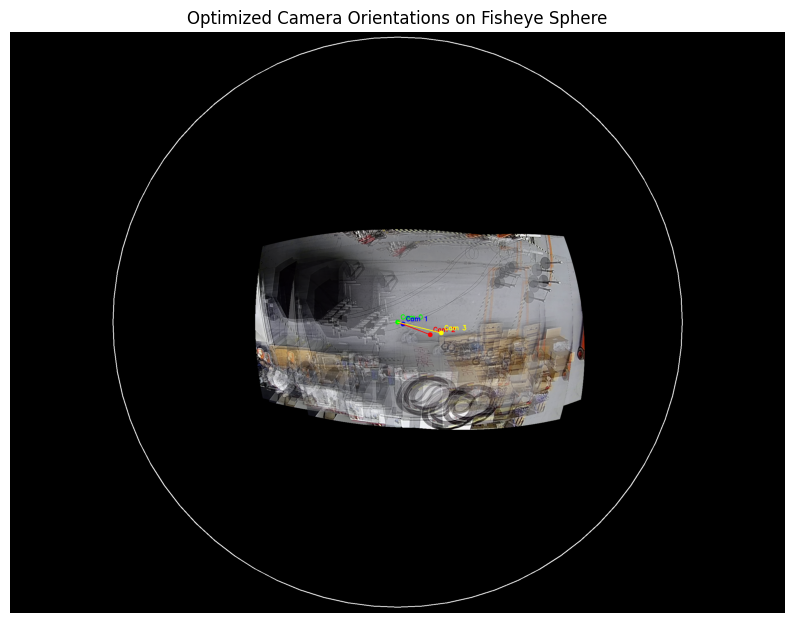

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# ================================================================
# REQUIREMENTS:
# - R_list  : list of 3x3 rotation matrices (from BA)
# - fisheye_params: dict as in your geometry code
# - fisheye_stitched: the stitched fisheye image (float 0..1)
# ================================================================

# --- Fisheye geometry ---
Hf, Wf = fisheye_params["height"], fisheye_params["width"]
cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

# --- Define how to project a 3D ray onto the fisheye image (equidistant) ---
def fisheye_project_ray_equidistant(ray, cx, cy, f, theta_max, radius):
    ray = ray / np.linalg.norm(ray)
    x, y, z = ray
    theta = np.arccos(np.clip(z, -1, 1))
    phi = np.arctan2(y, x)
    r = (theta / theta_max) * radius
    u = cx + r * np.cos(phi)
    v = cy - r * np.sin(phi)
    return int(u), int(v)

# --- Compute fisheye focal (for reference projection) ---
f_fish = radius / theta_max  # equidistant model

# --- Visualization canvas ---
vis = (fisheye_stitched.copy() * 255).astype(np.uint8)
vis = cv2.cvtColor(vis, cv2.COLOR_RGB2BGR)

# --- Define some colors for the view directions ---
colors = [
    (0, 255, 0),    # reference - green
    (255, 0, 0),    # blue
    (0, 0, 255),    # red
    (0, 255, 255),  # yellow
    (255, 0, 255),  # magenta
    (255, 255, 0),  # cyan
]

# --- Draw each camera’s view direction ---
for i, R_i in enumerate(R_list):
    # Optical axis direction in global frame
    # Each camera looks along its local +Z axis → rotate (0,0,1)
    dir_vec = R_i @ np.array([0, 0, 1])
    u, v = fisheye_project_ray_equidistant(dir_vec, cx_f, cy_f, f_fish, theta_max, radius)

    # Draw vector from center to direction point
    cv2.line(vis, (int(cx_f), int(cy_f)), (u, v), colors[i % len(colors)], 2)
    cv2.circle(vis, (u, v), 8, colors[i % len(colors)], -1)
    cv2.putText(vis, f"Cam {i}", (u + 10, v - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, colors[i % len(colors)], 2)

# --- Draw fisheye circle ---
cv2.circle(vis, (int(cx_f), int(cy_f)), int(radius), (255, 255, 255), 2)

# --- Convert back to RGB for Matplotlib ---
vis_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(vis_rgb)
plt.title("Optimized Camera Orientations on Fisheye Sphere")
plt.axis("off")
plt.show()


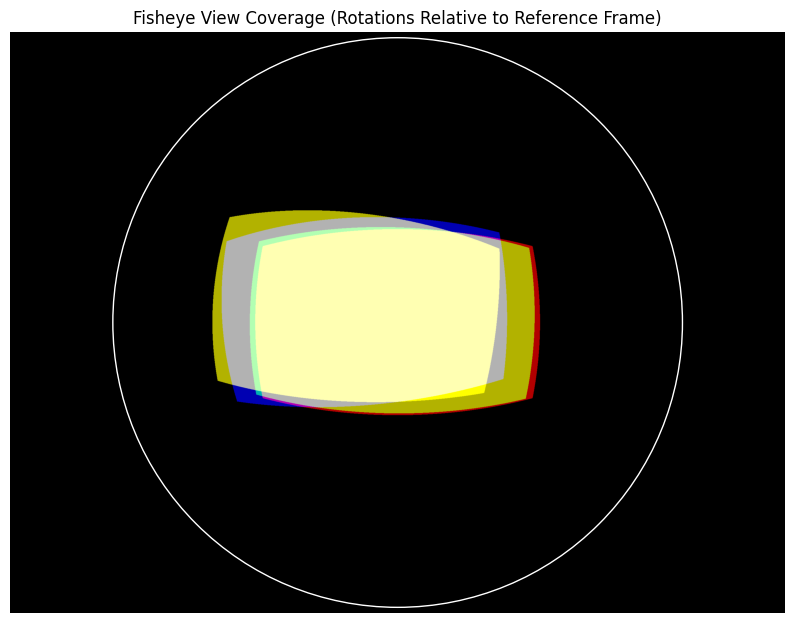

In [15]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# =====================================================
# FISHEYE PARAMETERS
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# =====================================================
# RECT → FISHEYE (Mask Only)
# =====================================================
def project_mask_to_fisheye(R_cam, fisheye_params):
    """Project a rectilinear 90° FOV mask to fisheye using rotation relative to reference."""
    Hr, Wr = 720, 1280  # rect dimensions
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    # rect intrinsics
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(90.0 / 2))

    # fisheye grid
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)

    # fisheye rays (in reference frame)
    ray_global = np.dstack([
        np.sin(theta) * np.cos(phi),
        np.sin(theta) * np.sin(phi),
        np.cos(theta)
    ])

    # rotate reference rays into this camera’s frame
    ray_local = ray_global @ R_cam.T
    Xc, Yc, Zc = ray_local[..., 0], ray_local[..., 1], ray_local[..., 2]

    # project onto rect
    u = f * (Xc / (Zc + 1e-6)) + cx_r
    v = f * (Yc / (Zc + 1e-6)) + cy_r

    # validity check
    valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)
    return valid.astype(np.uint8)

# =====================================================
# COLOR MAP STITCH (REFERENCE FRAME)
# =====================================================
def visualize_masks_reference(R_list, fisheye_params):
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx, cy, radius = fisheye_params["cx"], fisheye_params["cy"], fisheye_params["radius"]

    # create fisheye canvas
    canvas = np.zeros((Hf, Wf, 3), np.float32)

    colors = [
        (1.0, 0.0, 0.0),   # red
        (0.0, 1.0, 0.0),   # green
        (0.0, 0.0, 1.0),   # blue
        (1.0, 1.0, 0.0),   # yellow
        (0.0, 1.0, 1.0),   # cyan
        (1.0, 0.0, 1.0),   # magenta
    ]

    for i, R_cam in enumerate(R_list):
        mask = project_mask_to_fisheye(R_cam, fisheye_params)
        color = np.array(colors[i % len(colors)], dtype=np.float32)
        canvas[mask == 1] += color * 0.7  # overlay effect

    # mask circular fisheye region
    yy, xx = np.mgrid[0:Hf, 0:Wf]
    circ_mask = ((xx - cx)**2 + (yy - cy)**2) <= radius**2
    canvas[~circ_mask] = 0

    plt.figure(figsize=(10,10))
    plt.imshow(np.clip(canvas, 0, 1))
    circ = plt.Circle((cx, cy), radius, color='white', fill=False, linewidth=1)
    plt.gca().add_patch(circ)
    plt.title("Fisheye View Coverage (Rotations Relative to Reference Frame)")
    plt.axis("off")
    plt.show()

# =====================================================
# EXAMPLE — BA ROTATIONS (replace with yours)
# =====================================================
R_list = [
    np.eye(3),
    np.array([[0.999, -0.02, 0.03],
              [0.02,  0.999, -0.01],
              [-0.03, 0.01,  0.999]]),
    np.array([[0.98, 0.05, 0.18],
              [-0.05, 0.99, -0.07],
              [-0.18, 0.06, 0.98]]),
    np.array([[0.97, -0.08, 0.24],
              [0.09,  0.99, -0.06],
              [-0.23, 0.08, 0.97]])
]

# =====================================================
# RUN MASK VISUALIZATION
# =====================================================
visualize_masks_reference(R_list, fisheye_params)


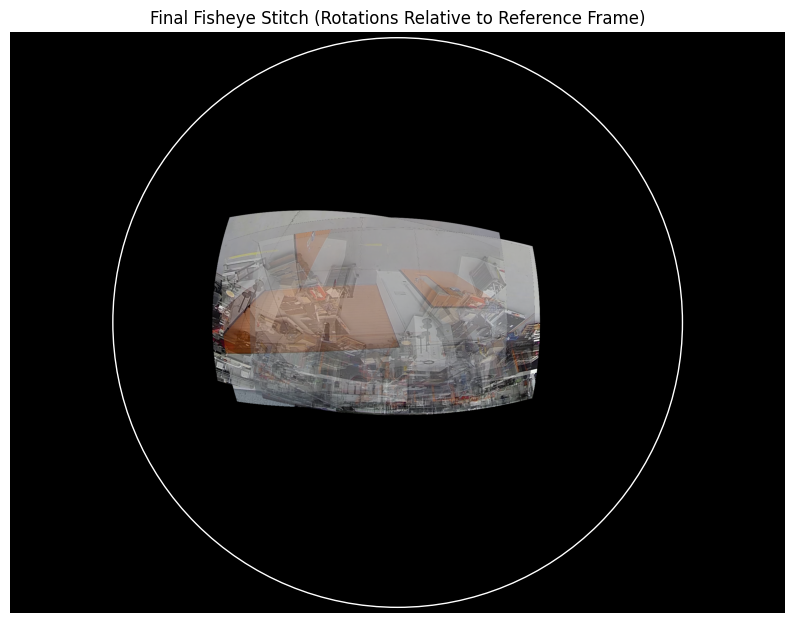

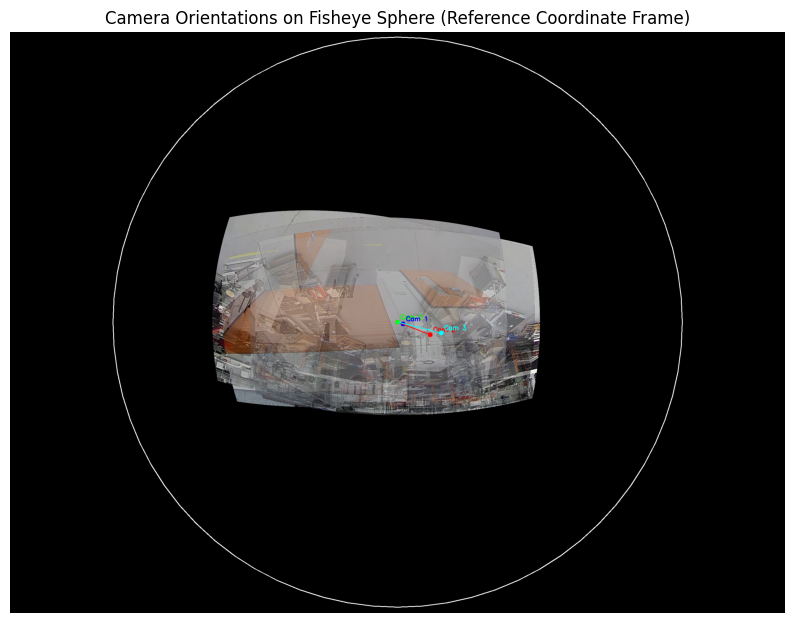

In [14]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# =====================================================
# FISHEYE PARAMETERS
# =====================================================
fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

# =====================================================
# FISHEYE PROJECTION UTILITIES
# =====================================================
def fisheye_project_ray(ray, cx, cy, radius, theta_max):
    """Project a 3D ray direction to fisheye coordinates."""
    ray = ray / np.linalg.norm(ray)
    x, y, z = ray
    theta = np.arccos(np.clip(z, -1, 1))
    phi = np.arctan2(y, x)
    r = (theta / theta_max) * radius
    u = cx + r * np.cos(phi)
    v = cy - r * np.sin(phi)
    return u, v


def project_rect_to_fisheye(rect_img, R_ref_to_cam, fisheye_params):
    """
    Project rectilinear view into fisheye image using rotation w.r.t. reference frame.
    This keeps everything in reference coordinates.
    """
    Hr, Wr = rect_img.shape[:2]
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    # Rect camera intrinsics
    cx_r, cy_r = Wr / 2, Hr / 2
    f = (Wr / 2) / np.tan(np.deg2rad(90.0 / 2))  # FOV = 90°

    # Fisheye pixel grid
    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)

    # Global fisheye rays (reference frame)
    ray_global = np.dstack([
        np.sin(theta) * np.cos(phi),
        np.sin(theta) * np.sin(phi),
        np.cos(theta)
    ])

    # Rotate rays from reference to this camera frame
    R_cam = R_ref_to_cam
    ray_local = ray_global @ R_cam.T

    Xc, Yc, Zc = ray_local[..., 0], ray_local[..., 1], ray_local[..., 2]

    # Perspective projection
    u = f * (Xc / (Zc + 1e-6)) + cx_r
    v = f * (Yc / (Zc + 1e-6)) + cy_r

    valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)
    warped = cv2.remap(rect_img, u.astype(np.float32), v.astype(np.float32),
                       cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)

    mask = np.zeros((Hf, Wf), np.uint8)
    mask[valid] = 1
    return warped, mask

# =====================================================
# VISUALIZATION: CAMERA DIRECTIONS
# =====================================================
def visualize_reference_frame(fisheye_stitched, R_list, fisheye_params):
    cx, cy = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]
    vis = (fisheye_stitched.copy() * 255).astype(np.uint8)
    vis = cv2.cvtColor(vis, cv2.COLOR_RGB2BGR)
    colors = [(0,255,0),(255,0,0),(0,0,255),(255,255,0),(255,0,255)]

    for i, R_i in enumerate(R_list):
        dir_vec = R_i @ np.array([0, 0, 1])  # optical axis in reference frame
        u, v = fisheye_project_ray(dir_vec, cx, cy, radius, theta_max)
        cv2.line(vis, (int(cx), int(cy)), (int(u), int(v)), colors[i % len(colors)], 2)
        cv2.circle(vis, (int(u), int(v)), 8, colors[i % len(colors)], -1)
        cv2.putText(vis, f"Cam {i}", (int(u)+10, int(v)-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, colors[i % len(colors)], 2)

    cv2.circle(vis, (int(cx), int(cy)), int(radius), (255,255,255), 2)
    vis_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10,10))
    plt.imshow(vis_rgb)
    plt.title("Camera Orientations on Fisheye Sphere (Reference Coordinate Frame)")
    plt.axis("off")
    plt.show()

# =====================================================
# MAIN STITCH
# =====================================================

# Load your images
views = [
    cv2.cvtColor(cv2.imread(f"captures_yaw_pitch/capture1/view{i+1}_1.jpg"), cv2.COLOR_BGR2RGB) / 255.0
    for i in range(4)
]

# Example BA-optimized rotation matrices (replace with your actual R_list)
R_list = [
    np.eye(3),  # reference camera
    np.array([[0.999, -0.02, 0.03],
              [0.02,  0.999, -0.01],
              [-0.03, 0.01,  0.999]]),
    np.array([[0.98, 0.05, 0.18],
              [-0.05, 0.99, -0.07],
              [-0.18, 0.06, 0.98]]),
    np.array([[0.97, -0.08, 0.24],
              [0.09,  0.99, -0.06],
              [-0.23, 0.08, 0.97]])
]

# Reference is camera 0
REF_IDX = 0

Hf, Wf = fisheye_params["height"], fisheye_params["width"]
fisheye_canvas = np.zeros((Hf, Wf, 3), np.float32)
weight_mask = np.zeros((Hf, Wf, 1), np.float32)

for i, rect_img in enumerate(views):
    warped, mask = project_rect_to_fisheye(rect_img, R_list[i], fisheye_params)
    fisheye_canvas += warped * mask[..., None]
    weight_mask += mask[..., None]

weight_mask[weight_mask == 0] = 1
fisheye_stitched = fisheye_canvas / weight_mask

# Circular mask
cx, cy, radius = fisheye_params["cx"], fisheye_params["cy"], fisheye_params["radius"]
yy, xx = np.mgrid[0:Hf, 0:Wf]
circle_mask = ((xx - cx)**2 + (yy - cy)**2) <= radius**2
fisheye_stitched[~circle_mask] = 0

plt.figure(figsize=(10,10))
plt.imshow(fisheye_stitched)
circ = plt.Circle((cx, cy), radius, color=(1,1,1), fill=False, linewidth=1)
plt.gca().add_patch(circ)
plt.title("Final Fisheye Stitch (Rotations Relative to Reference Frame)")
plt.axis("off")
plt.show()

# Visualize directions
visualize_reference_frame(fisheye_stitched, R_list, fisheye_params)


In [106]:


K_fisheye = np.array([
    [1274.7099536921774, 0.0, 640.0],
    [0.0, 1274.7099536921774, 360.0],
    [0.0, 0.0, 1.0],
], dtype=np.float64)


D_fisheye = np.zeros(4, dtype=np.float64)

K_rect = np.array([
    [1280.0, 0.0, 640.0],
    [0.0, 1280.0, 360.0],
    [0.0, 0.0, 1.0],
], dtype=np.float64)


def normalize(v):
  
    n = np.linalg.norm(v, axis=-1, keepdims=True)
    n[n == 0] = 1.0
    return v / n

def rectilinear_to_ray(px, K):
  
    px = np.asarray(px, np.float64).reshape(-1, 2)
    fx, fy = K[0,0], K[1,1]
    cx, cy = K[0,2], K[1,2]

    x = (px[:,0] - cx) / fx
    y = (px[:,1] - cy) / fy
    v = np.stack([x, y, np.ones_like(x)], axis=-1)  
    return normalize(v)

def fisheye_project_ray(ray, K, D=D_fisheye):
    
    pts = np.asarray(ray, np.float64).reshape(-1, 1, 3)
    imgpts, _ = cv2.fisheye.projectPoints(
        pts,
        np.zeros(3, dtype=np.float64),  
        np.zeros(3, dtype=np.float64),  
        K,
        D,
    )
    return imgpts.reshape(-1, 2)


def choose_ref(matches):
    counts = {}
    for (i, j), v in matches.items():
        counts[i] = counts.get(i, 0) + len(v[0])
        counts[j] = counts.get(j, 0) + len(v[1])

    return max(counts, key=counts.get) if counts else 0


def ransac_filter_rotation(mk0, mk1, K_rect, max_iter=200, sample_size=50, ang_thresh_deg=1):
   
    mk0 = np.asarray(mk0, dtype=np.float64)
    mk1 = np.asarray(mk1, dtype=np.float64)
    n = len(mk0)
    if n < 3:
        return np.zeros(n, dtype=bool)

    r0_all = rectilinear_to_ray(mk0, K_rect)
    r1_all = rectilinear_to_ray(mk1, K_rect)

    best_inliers = []
    ang_thresh = np.deg2rad(ang_thresh_deg)
    idxs = np.arange(n)

    for _ in range(max_iter):
        samp = np.random.choice(idxs, min(sample_size, n), replace=False)
        try:
            H = r0_all[samp].T @ r1_all[samp]
            U, _, Vt = np.linalg.svd(H)
            Rm = Vt.T @ U.T
            if np.linalg.det(Rm) < 0:
                Vt[-1, :] *= -1
                Rm = Vt.T @ U.T
        except Exception:
            continue

        r0_rot = (Rm @ r0_all.T).T
        cosang = np.clip(np.sum(r0_rot * r1_all, axis=1), -1.0, 1.0)
        ang = np.arccos(cosang)

        inliers = np.where(ang < ang_thresh)[0]
        if len(inliers) > len(best_inliers):
            best_inliers = inliers

        if len(best_inliers) > 0.95 * n:
            break

    mask = np.zeros(n, dtype=bool)
    if len(best_inliers) > 0:
        mask[best_inliers] = True

    return mask


# Build matches and choose reference 
REF_IDX = choose_ref(matches_dict)
print(f"[info] Reference crop index: {REF_IDX}")

pairs = []
for (i, j), v in matches_dict.items():
    mk0 = np.asarray(v[0], dtype=np.float64)
    mk1 = np.asarray(v[1], dtype=np.float64)
    if len(mk0) < 6:
        continue

    mask = ransac_filter_rotation(mk0, mk1, K_rect)
    mk0_in = mk0[mask]
    mk1_in = mk1[mask]
    if len(mk0_in) < 6:
        continue

    pairs.append((i, j, mk0_in, mk1_in))

print(f"[RANSAC] Retained {len(pairs)} pairs")


# Prepare BA variables 
n_crops = len(images)
camera_indices = [i for i in range(n_crops) if i != REF_IDX]

def pack_rotvecs(rot):
    return np.hstack([rot[i] for i in camera_indices]) if camera_indices else np.array([])


def unpack_rotvecs(x):
    r = {i: np.zeros(3, dtype=np.float64) for i in range(n_crops)}
    if x.size == 0:
        return r
    idx = 0
    for i in camera_indices:
        r[i] = x[idx:idx + 3].copy()
        idx += 3
    return r


rotvecs_init = {i: np.zeros(3, dtype=np.float64) for i in range(n_crops)}
x0 = pack_rotvecs(rotvecs_init)

def compute_angular_error(rotvecs_dict):
    angs = []
    for (i, j, mk0, mk1) in pairs:
        R0 = np.eye(3) if i == REF_IDX else R.from_rotvec(rotvecs_dict[i]).as_matrix()
        R1 = np.eye(3) if j == REF_IDX else R.from_rotvec(rotvecs_dict[j]).as_matrix()

        r0 = rectilinear_to_ray(mk0, K_rect)
        r1 = rectilinear_to_ray(mk1, K_rect)

        rw0 = (R0 @ r0.T).T
        rw1 = (R1 @ r1.T).T

        cosang = np.clip(np.sum(rw0 * rw1, axis=1), -1.0, 1.0)
        angs.extend(np.degrees(np.arccos(cosang)))

    return np.array(angs)
# Ray-BA
def residuals_ray_BA(x):
    rotvecs = unpack_rotvecs(x)
    parts = []

    for (i, j, mk0, mk1) in pairs:
        R0 = np.eye(3) if i == REF_IDX else R.from_rotvec(rotvecs[i]).as_matrix()
        R1 = np.eye(3) if j == REF_IDX else R.from_rotvec(rotvecs[j]).as_matrix()

        r0 = rectilinear_to_ray(mk0, K_rect)
        r1 = rectilinear_to_ray(mk1, K_rect)

        Ra = (R0 @ r0.T).T
        Rb = (R1 @ r1.T).T

        n = float(max(1.0, r0.shape[0]))
        parts.append((np.cross(Ra, Rb) / np.sqrt(n)).ravel())

    return np.hstack(parts) if parts else np.array([])


print("Running Ray-BA ...")
t0 = time.time()
res = least_squares(residuals_ray_BA,x0,loss="soft_l1",f_scale=0.8,ftol=1e-12,xtol=1e-12,max_nfev=400,verbose=2)
x_opt = res.x
rotvecs_opt = unpack_rotvecs(x_opt)

# Pixel-BA 
def pixel_residuals(x):
    rotvecs = unpack_rotvecs(x)
    Kf = K_fisheye.copy()

    parts = []
    for (i, j, mk0, mk1) in pairs:
        R0 = np.eye(3) if i == REF_IDX else R.from_rotvec(rotvecs[i]).as_matrix()
        R1 = np.eye(3) if j == REF_IDX else R.from_rotvec(rotvecs[j]).as_matrix()

        r0 = rectilinear_to_ray(mk0, K_rect)
        r1 = rectilinear_to_ray(mk1, K_rect)

        rw0 = (R0 @ r0.T).T
        rw1 = (R1 @ r1.T).T

        p0 = fisheye_project_ray(rw0, Kf)
        p1 = fisheye_project_ray(rw1, Kf)

        n = float(max(1.0, r0.shape[0]))
        parts.append(((p0 - p1) / np.sqrt(n)).ravel())

    return np.hstack(parts) if parts else np.array([])


print("pixel-space refinement...")
res_pix = least_squares(lambda x: pixel_residuals(x), x_opt, loss="soft_l1", f_scale=0.8, ftol=1e-12, xtol=1e-12, max_nfev=300, verbose=2)

x_pix = res_pix.x
rotvecs_opt = unpack_rotvecs(x_pix)

# Diagnostics
res_final = pixel_residuals(x_pix)
errs = np.linalg.norm(res_final.reshape(-1, 2), axis=1) if res_final.size else np.array([])
ang_errs_pix = compute_angular_error(rotvecs_opt)

al_lg_mean_px = np.nanmean(errs)
al_lg_median_px = np.nanmedian(errs)
al_lg_mean_ang = np.nanmean(ang_errs_pix)
al_lg_median_ang = np.nanmedian(ang_errs_pix)
R_list = []
for i in range(n_crops):
    if i == REF_IDX:
        R_opt = np.eye(3)
        print(f"\nCamera {i} (Reference):\n{R_opt}")
    else:
        R_opt = R.from_rotvec(rotvecs_opt[i]).as_matrix()
        print(f"\nCamera {i}:\n{R_opt}")
    R_list.append(R_opt)
print(
    f"Pixel Error: mean={np.nanmean(errs):.3f}px, median={np.nanmedian(errs):.3f}px"
)
print(
    f"Angular Error: mean={np.nanmean(ang_errs_pix):.3f}°, median={np.nanmedian(ang_errs_pix):.3f}°"
)


[info] Reference crop index: 0
[RANSAC] Retained 2 pairs
Running Ray-BA ...
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         2.2305e-01                                    4.30e-01    
       1              2         1.5787e-02      2.07e-01       1.00e+00       1.50e-01    
       2              4         1.1703e-02      4.08e-03       5.00e-01       1.08e-01    
       3              5         2.6843e-03      9.02e-03       1.00e+00       2.13e-02    
       4              7         1.2364e-04      2.56e-03       5.00e-01       5.41e-03    
       5             10         1.0367e-04      2.00e-05       6.25e-02       4.47e-04    
       6             12         9.4964e-05      8.70e-06       3.12e-02       4.25e-05    
       7             15         9.4913e-05      5.05e-08       3.91e-03       1.62e-05    
       8             17         9.4910e-05      3.51e-09       1.95e-03       1.26e-05    
       9      

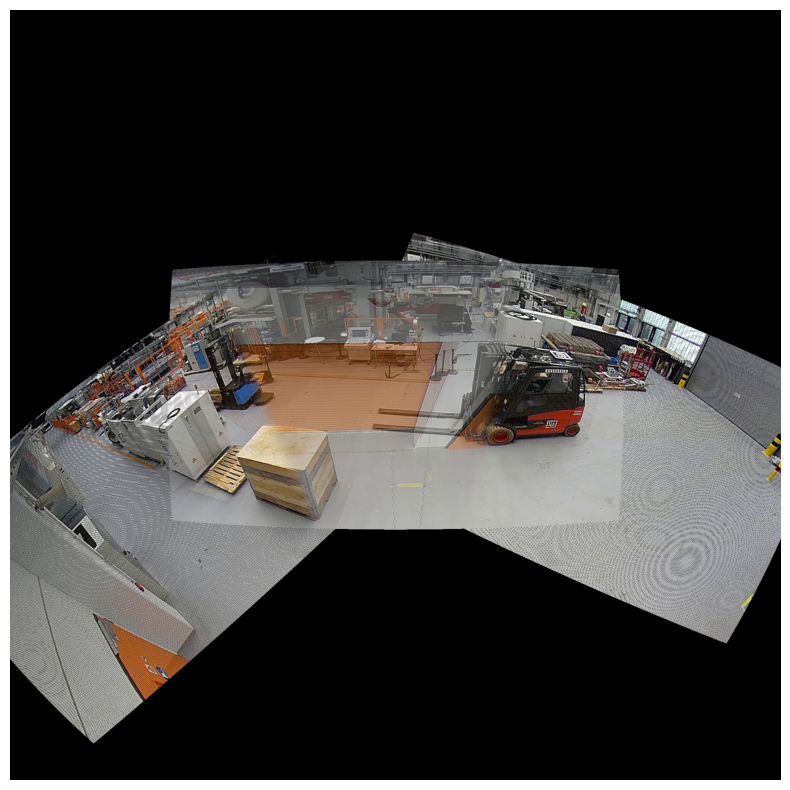

In [108]:
canvas_size = 2000
focal = float(K_fisheye[0, 0])
Wc, Hc = canvas_size, canvas_size

canvas = np.zeros((Hc, Wc, 3), dtype=np.float32)
weight = np.zeros((Hc, Wc), dtype=np.float32)

offset_x = Wc / 2 - K_fisheye[0, 2]
offset_y = Hc / 2 - K_fisheye[1, 2]

for cam_idx, img in enumerate(image_rgb):
    Rm = np.eye(3) if cam_idx == REF_IDX else R.from_rotvec(rotvecs_opt[cam_idx]).as_matrix()

    h, w = img.shape[:2]
    step = 1 
    xv, yv = np.meshgrid(np.arange(0, w, step), np.arange(0, h, step))
    pts = np.stack([xv.ravel(), yv.ravel()], axis=-1)

    cx, cy = w / 2.0, h / 2.0
    sigma = min(w, h) / 10.0
    w_img = np.exp(-((xv - cx)**2 + (yv - cy)**2) / (2 * sigma**2)).astype(np.float32)

    rays = rectilinear_to_ray(pts, K_rect)
    rays_rot = (Rm @ rays.T).T
    proj = fisheye_project_ray(rays_rot, K_fisheye)
    proj_rounded = np.round(proj).astype(int)

    proj_rounded[:, 0] += int(offset_x)
    proj_rounded[:, 1] += int(offset_y)

    valid = (proj_rounded[:, 0] >= 0) & (proj_rounded[:, 0] < Wc) & (proj_rounded[:, 1] >= 0) & (proj_rounded[:, 1] < Hc)

    if np.any(valid):
        xs = proj_rounded[valid, 0]
        ys = proj_rounded[valid, 1]
        img_valid = img[yv.ravel()[valid], xv.ravel()[valid]]
        w_valid = w_img[yv.ravel()[valid], xv.ravel()[valid]]
        canvas[ys, xs] += img_valid * w_valid[..., None]
        weight[ys, xs] += w_valid

mask = weight > 0
canvas[mask] /= weight[mask, None]
canvas = np.clip(canvas, 0, 255).astype(np.uint8)

plt.figure(figsize=(20, 10))
plt.imshow(canvas)
plt.axis('off')
plt.show()
